In [110]:
import pandas as pd ## pip install pandas

import numpy as np
import os
import ast
import seaborn as sns #pip install seaborn

import json
from datetime import datetime
from sklearn.experimental import enable_iterative_imputer #pip install pip install scikit-learn

from sklearn.impute import IterativeImputer

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier #pip install xgboost
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_predict,cross_val_score,train_test_split, GridSearchCV
from sklearn.metrics import make_scorer, average_precision_score, roc_auc_score, f1_score,  roc_curve, precision_recall_curve, auc, confusion_matrix,accuracy_score
from imblearn.pipeline import Pipeline as ImbPipeline  # pip install imblearn
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from collections import Counter
from lightgbm import LGBMClassifier #pip install lightgbm

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.metrics import Recall, Precision
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit


from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from imodels.rule_set.rule_fit import RuleFitClassifier
from sklearn.base import clone

from sklearn.model_selection import StratifiedKFold

## Data Preprocessing

In [2]:
# Define paths for all data directories
data_directories = {
    'game_performance': 'subjective/game-performance/game-performance.csv',
    'illness': 'subjective/illness/illness.csv',
    'training_load': 'subjective/training-load/',
    'wellness': 'subjective/wellness/',
    'injury': 'subjective/injury/injury.csv'
}

# Enhanced date detection function
def detect_date_column(df):
    date_aliases = ['date', 'timestamp', 'time', 'day', 'datum']
    for col in df.columns:
        if col.lower() in date_aliases:
            return col
    # If no date column found, assume first column is date
    return df.columns[0]

# Improved stats function
def print_file_stats(df, file_name):
    print(f"\n{file_name}:")
    
    # Detect date column
    date_col = detect_date_column(df)
    print(f"Detected date column: '{date_col}'")
    
    # Convert to datetime
    try:
        df[date_col] = pd.to_datetime(df[date_col], format='%d.%m.%Y')
    except:
        df[date_col] = pd.to_datetime(df[date_col], errors='coerce')
    
    # Print stats
    print(f"First Date: {df[date_col].min()}")
    print(f"Last Date: {df[date_col].max()}")
    missing_values = df.isnull().sum().sum()
    missing_percentage = (missing_values / df.size) * 100
    print(f"Missing Values: {missing_values}")
    print(f"Missing Percentage: {missing_percentage:.2f}%")
    
    return df.rename(columns={date_col: 'Date'})

# Load and process all data ================================================

# Training Load data
training_load_dfs = {}
training_load_files = [f for f in os.listdir(data_directories['training_load']) if f.endswith('.csv')]
for file in training_load_files:
    df = pd.read_csv(os.path.join(data_directories['training_load'], file))
    df = print_file_stats(df, f"Training Load/{file}")
    training_load_dfs[file.split('.')[0]] = df

# Wellness data
wellness_dfs = {}
wellness_files = [f for f in os.listdir(data_directories['wellness']) if f.endswith('.csv')]
for file in wellness_files:
    df = pd.read_csv(os.path.join(data_directories['wellness'], file))
    df = print_file_stats(df, f"Wellness/{file}")
    wellness_dfs[file.split('.')[0]] = df

# Game Performance
game_performance_df = pd.read_csv(data_directories['game_performance'])
game_performance_df = print_file_stats(game_performance_df, "Game Performance")

# Illness data
illness_df = pd.read_csv(data_directories['illness'])
illness_df = print_file_stats(illness_df, "Illness")

# Injury data
injury_df = pd.read_csv(data_directories['injury'])
injury_df = injury_df.drop_duplicates()
injury_df = print_file_stats(injury_df, "Injury")




Training Load/acwr.csv:
Detected date column: 'Date'
First Date: 2020-01-01 00:00:00
Last Date: 2021-12-31 00:00:00
Missing Values: 0
Missing Percentage: 0.00%

Training Load/atl.csv:
Detected date column: 'Date'
First Date: 2020-01-01 00:00:00
Last Date: 2021-12-31 00:00:00
Missing Values: 0
Missing Percentage: 0.00%

Training Load/ctl28.csv:
Detected date column: 'Date'
First Date: 2020-01-01 00:00:00
Last Date: 2021-12-31 00:00:00
Missing Values: 0
Missing Percentage: 0.00%

Training Load/ctl42.csv:
Detected date column: 'Date'
First Date: 2020-01-01 00:00:00
Last Date: 2021-12-31 00:00:00
Missing Values: 0
Missing Percentage: 0.00%

Training Load/daily_load.csv:
Detected date column: 'Date'
First Date: 2020-01-01 00:00:00
Last Date: 2021-12-31 00:00:00
Missing Values: 0
Missing Percentage: 0.00%

Training Load/monotony.csv:
Detected date column: 'Date'
First Date: 2020-01-01 00:00:00
Last Date: 2021-12-31 00:00:00
Missing Values: 0
Missing Percentage: 0.00%

Training Load/strain.c

In [4]:
# Load game performance data
game_performance_path = 'subjective/game-performance/game-performance.csv'
game_performance_df = pd.read_csv(game_performance_path)

# Convert timestamp to datetime format
game_performance_df['timestamp'] = pd.to_datetime(game_performance_df['timestamp'], format='%d.%m.%Y')

# Pivot data

# Load illness data
illness_path = 'subjective/illness/illness.csv'
illness_df = pd.read_csv(illness_path)

# Convert timestamp to datetime format
illness_df['timestamp'] = pd.to_datetime(illness_df['timestamp'], format='%d.%m.%Y')

# Load training load data
training_load_path = 'subjective/training-load/'
training_load_files = ['acwr.csv', 'atl.csv', 'ctl28.csv', 'ctl42.csv', 'daily_load.csv', 'monotony.csv', 'strain.csv', 'weekly_load.csv']

training_load_dfs = {}
for file in training_load_files:
    if file.endswith('.csv'):
        df = pd.read_csv(os.path.join(training_load_path, file))
        # the first column is the date and converting it to datetime
        df.columns = [col.strip() for col in df.columns]  # Clean column names
        if 'timestamp' in df.columns:
            df['timestamp'] = pd.to_datetime(df['timestamp'], format='%d.%m.%Y')
        else:
            df['timestamp'] = pd.to_datetime(df.iloc[:, 0], format='%d.%m.%Y')
            df = df.iloc[:, 1:]  # Remove the first column if it's the date
        training_load_dfs[file.split('.')[0]] = df


# Load wellness data
wellness_path = 'subjective/wellness/'
wellness_files = ['fatigue.csv', 'mood.csv', 'readiness.csv', 'sleep_duration.csv', 'sleep_quality.csv', 'soreness.csv', 'stress.csv']

wellness_dfs = {}
for file in wellness_files:
    df = pd.read_csv(os.path.join(wellness_path, file))
    # the first column is the date and converting it to datetime
    df.columns = [col.strip() for col in df.columns]  # Clean column names
    if 'timestamp' in df.columns:
        df['timestamp'] = pd.to_datetime(df['timestamp'], format='%d.%m.%Y')
    else:
        df['timestamp'] = pd.to_datetime(df.iloc[:, 0], format='%d.%m.%Y')
        df = df.iloc[:, 1:]  # Remove the first column if it's the date
    wellness_dfs[file.split('.')[0]] = df

# Load injury data
injury_path = 'subjective/injury/injury.csv'
injury_df = pd.read_csv(injury_path)

# Convert timestamp to datetime format
injury_df['timestamp'] = pd.to_datetime(injury_df['timestamp'], format='%d.%m.%Y')


In [5]:
training_load_dfs['acwr']

,TeamA-d7299614-fa73-4f69-b5e9-f913e3154ff6,TeamA-b58af410-da77-479e-b93c-e03617b9f36d,TeamA-5cd7a61b-88b2-46d2-94f8-5a0d4f682d93,TeamA-74afe68c-f348-414c-9754-6d6f9df12587,TeamA-bcc03f81-2733-45d3-abf1-f7a709c63e68,TeamA-2d44f941-2f24-4fc2-afa8-611a091f2e93,TeamA-ecdbd8ec-61a7-4131-97ec-3af76f621f65,TeamA-e920ae60-5c4b-4597-be27-fc6876dcec33,TeamA-af719df9-3e6c-4ad4-9e8e-0c0c45f4f76a,TeamA-c4ccf1a6-48c3-4a17-8d6c-eedd12e8680e,...,TeamB-ab5ec6e5-b0f3-401e-8dc5-aa6c5070e255,TeamB-d9501f3a-aaa1-4311-8b8b-3a8d3f21480f,TeamB-5eba590a-cecb-400f-a92e-08224c7e2e59,TeamB-7d41e602-eece-328b-ff7b-118e820865d6,TeamB-4b1e23d2-4204-4e16-9991-e0490649079b,TeamB-e1f63352-01cb-4688-9486-5c6f1e5cf0cd,TeamB-5a921187-19c7-8df4-8f4f-f31e78de5857,TeamB-6d568bee-175f-4dcb-9d3a-0f3e8f35de07,TeamB-08e35b7b-d2ad-411f-a0de-4e663f14c3c3,timestamp
0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-01
1,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-02
2,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-03
3,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-04
4,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,0.0,1.544273,0.0,2.062452,0.0,0.881168,0.609452,0.0,1.133735,1.458140,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2021-12-27
727,0.0,1.343921,0.0,1.858173,0.0,1.612332,0.637770,0.0,1.174707,1.488881,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2021-12-28
728,0.0,1.054129,0.0,1.899792,0.0,1.867266,0.503525,0.0,1.135733,1.555522,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2021-12-29
729,0.0,1.107428,0.0,1.375519,0.0,1.867266,0.440890,0.0,0.803304,1.699797,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2021-12-30


In [6]:
# Create a master dataframe with player names and dates
master_df = pd.DataFrame()

# Add game performance data
game_performance_pivot = game_performance_df.melt(id_vars=['player_name', 'timestamp'], var_name='data_type', value_name='value')
game_performance_pivot['feature'] = 'game_performance'
master_df = pd.concat([master_df, game_performance_pivot], ignore_index=True)

# Add illness data
illness_pivot = illness_df.melt(id_vars=['player_name', 'timestamp'], var_name='data_type', value_name='value')
illness_pivot['feature'] = 'illness'
master_df = pd.concat([master_df, illness_pivot], ignore_index=True)

# Add training load data
for file, df in training_load_dfs.items():
    df_pivot = df.melt(id_vars=['timestamp'], var_name='player_name', value_name='value')
    df_pivot['feature'] = f'training_load_{file}'
    df_pivot['data_type'] = file
    master_df = pd.concat([master_df, df_pivot], ignore_index=True)

# Add wellness data
for file, df in wellness_dfs.items():
    df_pivot = df.melt(id_vars=['timestamp'], var_name='player_name', value_name='value')
    df_pivot['feature'] = f'wellness_{file}'
    df_pivot['data_type'] = file
    master_df = pd.concat([master_df, df_pivot], ignore_index=True)

# Add injury data as target variable
injury_target = injury_df[['player_name', 'timestamp']]
injury_target['injury'] = 1
master_df = pd.merge(master_df, injury_target, on=['player_name', 'timestamp'], how='left')
master_df['injury'] = master_df['injury'].fillna(0)


In [7]:
master_df

,player_name,timestamp,data_type,value,feature,injury
0,TeamA-d7299614-fa73-4f69-b5e9-f913e3154ff6,2020-07-11,team_performance,7,game_performance,0.0
1,TeamA-d7299614-fa73-4f69-b5e9-f913e3154ff6,2020-10-07,team_performance,7,game_performance,0.0
2,TeamA-d7299614-fa73-4f69-b5e9-f913e3154ff6,2020-10-18,team_performance,5,game_performance,0.0
3,TeamA-d7299614-fa73-4f69-b5e9-f913e3154ff6,2020-10-31,team_performance,6,game_performance,0.0
4,TeamA-d7299614-fa73-4f69-b5e9-f913e3154ff6,2020-11-07,team_performance,4,game_performance,0.0
...,...,...,...,...,...,...
549094,TeamB-08e35b7b-d2ad-411f-a0de-4e663f14c3c3,2021-12-27,stress,NaN,wellness_stress,0.0
549095,TeamB-08e35b7b-d2ad-411f-a0de-4e663f14c3c3,2021-12-28,stress,NaN,wellness_stress,0.0
549096,TeamB-08e35b7b-d2ad-411f-a0de-4e663f14c3c3,2021-12-29,stress,NaN,wellness_stress,0.0
549097,TeamB-08e35b7b-d2ad-411f-a0de-4e663f14c3c3,2021-12-30,stress,NaN,wellness_stress,0.0


### Injury info

In [8]:
injury_df.type.unique()

array(['{"right_thigh":"minor"}', '{"right_foot":"minor"}',
       '{"left_thigh":"minor"}', '{"right_knee":"major"}',
       '{"right_foot":"minor","right_knee":"minor"}',
       '{"right_foot":"minor","right_knee":"major"}',
       '{"left_foot":"major","right_foot":"minor","right_knee":"minor"}',
       '{"right_thigh":"major"}',
       '{"left_thigh":"minor","right_thigh":"minor"}',
       '{"left_foot":"minor"}', '{"right_leg":"minor"}',
       '{"right_knee":"minor"}', '{"left_knee":"minor"}',
       '{"left_knee":"minor","left_thigh":"minor"}',
       '{"left_knee":"minor","left_leg":"minor","right_knee":"minor","right_leg":"minor"}',
       '{"groin_hip":"minor","left_knee":"major","right_knee":"major","stomach_back":"minor"}',
       '{"groin_hip":"minor","left_knee":"minor","right_knee":"major","stomach_back":"minor"}',
       '{"left_knee":"minor","right_knee":"major","stomach_back":"minor"}',
       '{"left_knee":"minor","right_knee":"major"}',
       '{"left_knee":"major",

In [9]:

# Parse JSON and separate major and minor injuries
def process_injuries(injury_json):
    injuries = json.loads(injury_json)
    major = [k for k, v in injuries.items() if v == 'major']
    minor = [k for k, v in injuries.items() if v == 'minor']
    return pd.Series({'major_injuries': major, 'minor_injuries': minor})

injury_df[['major_injuries', 'minor_injuries']] = injury_df['type'].apply(process_injuries)

# Create dictionaries to label each type of injury
all_major_injuries = set()
all_minor_injuries = set()

for _, row in injury_df.iterrows():
    all_major_injuries.update(row['major_injuries'])
    all_minor_injuries.update(row['minor_injuries'])

major_injury_dict = {injury: idx + 1 for idx, injury in enumerate(sorted(all_major_injuries))}
minor_injury_dict = {injury: idx + 1 for idx, injury in enumerate(sorted(all_minor_injuries))}

# Add labeled columns for major and minor injuries
def label_injuries(injuries, injury_dict):
    return [injury_dict[injury] for injury in injuries if injury in injury_dict]

injury_df['major_injury_labels'] = injury_df['major_injuries'].apply(lambda x: label_injuries(x, major_injury_dict))
injury_df['minor_injury_labels'] = injury_df['minor_injuries'].apply(lambda x: label_injuries(x, minor_injury_dict))

In [10]:
all_minor_injuries

{'groin_hip',
 'head_neck',
 'left_foot',
 'left_knee',
 'left_leg',
 'left_thigh',
 'right_foot',
 'right_knee',
 'right_leg',
 'right_thigh',
 'stomach_back'}

In [11]:
all_major_injuries

{'groin_hip',
 'left_foot',
 'left_knee',
 'right_knee',
 'right_thigh',
 'stomach_back'}

In [12]:
list_cols = injury_df.applymap(lambda x: isinstance(x, list)).any()
injury_df_p = injury_df.copy()
# Convert lists to tuples (hashable)
for col in list_cols[list_cols].index:
    injury_df_p[col] = injury_df_p[col].apply(lambda x: str(x) if isinstance(x, list) else x)

C:\Users\tss_0\AppData\Local\Temp\ipykernel_14652\1323602820.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  list_cols = injury_df.applymap(lambda x: isinstance(x, list)).any()


In [13]:
injury_df_p

,player_name,type,timestamp,major_injuries,minor_injuries,major_injury_labels,minor_injury_labels
0,TeamA-b58af410-da77-479e-b93c-e03617b9f36d,"{""right_thigh"":""minor""}",2020-03-20,[],['right_thigh'],[],[10]
1,TeamA-5cd7a61b-88b2-46d2-94f8-5a0d4f682d93,"{""right_foot"":""minor""}",2020-03-20,[],['right_foot'],[],[7]
2,TeamA-5cd7a61b-88b2-46d2-94f8-5a0d4f682d93,"{""right_foot"":""minor""}",2020-03-21,[],['right_foot'],[],[7]
3,TeamA-5cd7a61b-88b2-46d2-94f8-5a0d4f682d93,"{""right_foot"":""minor""}",2020-03-21,[],['right_foot'],[],[7]
4,TeamA-5cd7a61b-88b2-46d2-94f8-5a0d4f682d93,"{""right_foot"":""minor""}",2020-03-22,[],['right_foot'],[],[7]
...,...,...,...,...,...,...,...
157,TeamB-4405bb1f-56f7-48ba-bfa8-e795e4006952,"{""groin_hip"":""minor"",""left_thigh"":""minor""}",2020-01-31,[],"['groin_hip', 'left_thigh']",[],"[1, 6]"
158,TeamB-4405bb1f-56f7-48ba-bfa8-e795e4006952,"{""groin_hip"":""minor"",""stomach_back"":""minor""}",2020-02-07,[],"['groin_hip', 'stomach_back']",[],"[1, 11]"
159,TeamB-e4321aef-964a-4fdd-88bd-0bd548b0e93b,"{""left_foot"":""minor""}",2020-01-14,[],['left_foot'],[],[3]
160,TeamB-e4321aef-964a-4fdd-88bd-0bd548b0e93b,"{""left_foot"":""minor""}",2020-01-16,[],['left_foot'],[],[3]


In [14]:
injury_df_p = injury_df_p.drop_duplicates()

In [15]:
# total injuries
len(injury_df_p)

156

In [16]:
print("Major Injury Dictionary:")
print(json.dumps(major_injury_dict, indent=2))

print("\nMinor Injury Dictionary:")
print(json.dumps(minor_injury_dict, indent=2))


Major Injury Dictionary:
{
  "groin_hip": 1,
  "left_foot": 2,
  "left_knee": 3,
  "right_knee": 4,
  "right_thigh": 5,
  "stomach_back": 6
}

Minor Injury Dictionary:
{
  "groin_hip": 1,
  "head_neck": 2,
  "left_foot": 3,
  "left_knee": 4,
  "left_leg": 5,
  "left_thigh": 6,
  "right_foot": 7,
  "right_knee": 8,
  "right_leg": 9,
  "right_thigh": 10,
  "stomach_back": 11
}


### Master Data

In [17]:
def create_master_dataframe(training_load_dfs, wellness_dfs, injury_df, 
                           illness_df, game_performance_df, 
                           start_date='2020-01-01', end_date='2021-12-31'):
    """
    Creates a comprehensive master DataFrame for each player with:
    - Anonymized player IDs
    - Advanced absence calculations
    - Time-series aware imputation
    - Injury tracking and target variable
    """
    # Rename 'timestamp' to 'Date' locally for consistency
    injury_df.rename(columns={'timestamp': 'Date'}, inplace=True)
    illness_df.rename(columns={'timestamp': 'Date'}, inplace=True)
    game_performance_df.rename(columns={'timestamp': 'Date'}, inplace=True)

    # Create player ID mapping
    all_players = pd.concat([
        injury_df['player_name'],
        illness_df['player_name'],
        game_performance_df['player_name']
    ]).unique()
    
    player_mapping = {name: f'player_{i+1}' 
                     for i, name in enumerate(sorted(all_players))}
    
    # Create base date range
    date_range = pd.date_range(start=start_date, end=end_date, name='Date')
    
    master_data = {}

    for player_name, player_id in player_mapping.items():
        # Create base DataFrame with complete date range
        player_df = pd.DataFrame({'Date': date_range})
        
        # Merge training load data with forward fill
        for metric, df in training_load_dfs.items():
            if player_name in df.columns:
                # Rename 'timestamp' to 'Date' here temporarily for merging
                temp_df = df.rename(columns={'timestamp': 'Date'})[['Date', player_name]]
                temp_df.rename(columns={player_name: metric}, inplace=True)
                temp_df['Date'] = pd.to_datetime(temp_df['Date'])
                player_df['Date'] = pd.to_datetime(player_df['Date'])
                player_df = player_df.merge(temp_df, on='Date', how='left')
                player_df[metric] = player_df[metric].ffill().fillna(0)

        # Merge wellness data with proper time-based interpolation
        wellness_metrics = list(wellness_dfs.keys())
        for metric in wellness_metrics:
            df = wellness_dfs[metric]
            if player_name in df.columns:
                # Rename 'timestamp' to 'Date' here temporarily for merging
                temp_df = df.rename(columns={'timestamp': 'Date'})[['Date', player_name]]
                temp_df.rename(columns={player_name: metric}, inplace=True)
                player_df = player_df.merge(temp_df, on='Date', how='left')
                
                # Create temporary DatetimeIndex for interpolation
                temp_interp_df = player_df.set_index('Date')[metric].copy()
                player_df[f'{metric}_missing'] = temp_interp_df.isna().astype(int)
                
                # Perform time-based interpolation
                temp_interp_df = temp_interp_df.interpolate(method='time').ffill().bfill()
                player_df[metric] = temp_interp_df.values

        # Merge injury data with target variable
        player_injuries = injury_df[injury_df['player_name'] == player_name]
        player_df['injured'] = player_df['Date'].isin(player_injuries['Date']).astype(int)

        # Add new features to help model know more about the players (unchanged logic)
        first_training_date = player_df[player_df['daily_load'] > 0]['Date'].min()
        valid_period = player_df['Date'] >= first_training_date
        
        # Add new features to help model know more about the players
        # Consecutive absence calculation
        player_df['absence_flag'] = ((player_df['daily_load'] == 0) & valid_period).astype(int)
        player_df['consecutive_absence'] = player_df.groupby(
            (player_df['absence_flag'] != player_df['absence_flag'].shift()).cumsum()
        )['absence_flag'].cumsum() * player_df['absence_flag']

        # Max consecutive absence
        player_df['max_consecutive_absence'] = (
            player_df['consecutive_absence']
            .where(valid_period)
            .cummax()
            .fillna(0)
        )

        # Total absence days
        player_df['absence_days'] = (
            player_df['absence_flag']
            .where(valid_period)
            .cumsum()
            .fillna(0)
        )

        # Cumulative training days
        player_df['cumulative_training'] = (
            (player_df['daily_load'] > 0)
            .where(valid_period)
            .cumsum()
            .fillna(0)
        )

        # Merge illness data
        player_illnesses = illness_df[illness_df['player_name'] == player_name]
        player_df = player_df.merge(
            player_illnesses[['Date', 'problems']],
            on='Date', how='left', suffixes=('', '_illness')
        )
        player_df['problems'] = player_df['problems'].fillna('No Problem')

        # Merge game performance with zero-fill
        player_performance = game_performance_df[
            game_performance_df['player_name'] == player_name
        ]
        performance_cols = ['team_performance', 'offensive_performance', 'defensive_performance']
        player_df = player_df.merge(
            player_performance[['Date'] + performance_cols],
            on='Date', how='left'
        )
        player_df[performance_cols] = player_df[performance_cols].fillna(0)
        player_df['game_day'] = player_df['team_performance'].ne(0).astype(int)

        # Calculate weekly moving average for ACWR
        # Calculate rolling averages
        player_df['acwr_weekly_moving_avg'] = player_df['acwr'].rolling(window=7, min_periods=1).mean().fillna(0)
        player_df['acwr_monthly_moving_avg'] = player_df['acwr'].rolling(window=30, min_periods=1).mean().fillna(0)
        player_df['daily_load_weekly_moving_avg'] = player_df['daily_load'].rolling(window=7, min_periods=1).mean().fillna(0)
        player_df['daily_load_monthly_moving_avg'] = player_df['daily_load'].rolling(window=30, min_periods=1).mean().fillna(0)

        # Calculate binary columns for last night's sleep quality and duration
        player_df['last_night_sleep_Q'] = (player_df['sleep_quality'].shift(1).fillna(0) >= 3).astype(int)
        player_df['last_night_sleep_D'] = (player_df['sleep_duration'].shift(1).fillna(0) >= 8).astype(int)   


        # Calculate last week's average for sleep duration and quality
        player_df['last_week_sleep_duration_avg'] = player_df['sleep_duration'].rolling(window=7,min_periods=1).mean().fillna(0)
        player_df['last_week_sleep_quality_avg'] = player_df['sleep_quality'].rolling(window=7,min_periods=1).mean().fillna(0)

        # Check if there was an injury in the last week
        player_df['last_week_injured'] = (player_df['injured'].rolling(window=7).sum() > 0).astype(int)

        # Drop duplicates after merging
        player_df = player_df.drop_duplicates(subset='Date', keep='first')
        
        # Final processing
        player_df.insert(0, 'player_id', player_id)
        player_df.set_index(['player_id', 'Date'], inplace=True)
        
        # Add to master data
        master_data[player_id] = player_df

    return master_data, player_mapping


In [18]:
player_data, player_mapping = create_master_dataframe(
    training_load_dfs, 
    wellness_dfs,
    injury_df_p,
    illness_df,
    game_performance_df
)

C:\Users\tss_0\AppData\Local\Temp\ipykernel_14652\1891115660.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  injury_df.rename(columns={'timestamp': 'Date'}, inplace=True)


In [19]:
player_data['player_1']['cumulative_training']

player_id  Date      
player_1   2020-01-01      0.0
           2020-01-02      0.0
           2020-01-03      0.0
           2020-01-04      0.0
           2020-01-05      0.0
                         ...  
           2021-12-27    138.0
           2021-12-28    138.0
           2021-12-29    139.0
           2021-12-30    140.0
           2021-12-31    141.0
Name: cumulative_training, Length: 731, dtype: float64

In [20]:
player_mapping

{'TeamA-0362cdd5-7a63-480a-a46a-62a99fb1692f': 'player_1',
 'TeamA-2d44f941-2f24-4fc2-afa8-611a091f2e93': 'player_2',
 'TeamA-358603ef-b3a3-46b5-b80a-ad64e06b6592': 'player_3',
 'TeamA-3e5f6e2b-46b7-4890-84a9-3bbb2649af5a': 'player_4',
 'TeamA-4051bba7-1170-4c43-b912-8c38815a7625': 'player_5',
 'TeamA-560cb066-a8ae-412f-b09f-0d2a6aa0cf05': 'player_6',
 'TeamA-5a3be598-2f51-426f-95a5-b63d1d7c1b43': 'player_7',
 'TeamA-5a5b135d-d146-4b4c-b3da-efcd4d203f95': 'player_8',
 'TeamA-5cd7a61b-88b2-46d2-94f8-5a0d4f682d93': 'player_9',
 'TeamA-705923a2-378f-4f8e-8a29-464837b88cdc': 'player_10',
 'TeamA-74afe68c-f348-414c-9754-6d6f9df12587': 'player_11',
 'TeamA-78f2ae2c-caf7-47eb-9e84-521f7820182e': 'player_12',
 'TeamA-7a0fe0d4-c3f7-4ba1-8210-2ee9354d331e': 'player_13',
 'TeamA-82a0cc6a-a398-4c89-b5fb-34bc4b53dbea': 'player_14',
 'TeamA-967090b2-87d4-476b-adba-56cfaf65ba87': 'player_15',
 'TeamA-af719df9-3e6c-4ad4-9e8e-0c0c45f4f76a': 'player_16',
 'TeamA-affd6f1d-b364-4700-98bf-8f20896e5ac4': 'p

In [21]:
player_data['player_2'].loc['player_2'].loc['2020-03-30']

acwr                               2.666644
atl                                  394.29
ctl28                                147.86
ctl42                                 98.57
daily_load                            520.0
monotony                                4.2
strain                              11592.0
weekly_load                          2760.0
fatigue                                 3.0
fatigue_missing                         NaN
mood                                    3.0
mood_missing                            NaN
readiness                               6.0
readiness_missing                       NaN
sleep_duration                          8.0
sleep_duration_missing                  NaN
sleep_quality                           3.0
sleep_quality_missing                   NaN
soreness                                3.0
soreness_missing                        NaN
stress                                  3.0
stress_missing                          NaN
injured                         

In [22]:
player_data['player_1'][player_data['player_1'].loc[:,['sleep_duration','last_night_sleep_D']]['sleep_duration']<8].loc[:,['sleep_duration','last_night_sleep_D']]

sleep_duration  last_night_sleep_D
player_id Date                                          
player_1  2021-06-17            6.00                   1
          2021-06-27            7.00                   1
          2021-07-05            7.50                   1
          2021-07-12            6.00                   1
          2021-07-18            6.00                   1
          2021-07-28            7.50                   1
          2021-07-30            6.25                   1
          2021-07-31            4.00                   0
          2021-08-08            7.00                   1
          2021-08-20            7.50                   1
          2021-08-27            7.50                   1
          2021-10-01            6.00                   1
          2021-10-21            7.50                   1
          2021-11-14            4.00                   1
          2021-11-17            5.50                   1
          2021-12-10            7.50                   1
          2021-12-15            6.00                   1
          2021-12-18            6.00                   1

In [23]:

# Combine all player data into single DataFrame
full_df = pd.concat(player_data.values()).reset_index()

# Convert Date to integer time_idx per player
full_df['time_idx'] = full_df.groupby('player_id').cumcount()
full_df = full_df.sort_values(['player_id', 'time_idx'])

# Adjust parameters based on minimum series length
min_series_length = full_df.groupby('player_id').size().min()
base_encoder_length = 7
base_prediction_length = 7  # Start with equal base lengths

# Ensure valid parameter relationships
if min_series_length < (base_encoder_length + base_prediction_length):
    max_prediction_length = max(1, min_series_length - base_encoder_length)  # Minimum 1 day prediction
else:
    max_prediction_length = base_prediction_length

# Set min_prediction_length <= max_prediction_length
min_prediction_length = min(3, max_prediction_length)  # Never exceed max_prediction_length

# Final validation
assert max_prediction_length >= min_prediction_length, "Prediction length conflict"
assert (base_encoder_length + max_prediction_length) <= min_series_length, "Insufficient data length"

full_df

,player_id,Date,acwr,atl,ctl28,ctl42,daily_load,monotony,strain,weekly_load,...,acwr_weekly_moving_avg,acwr_monthly_moving_avg,daily_load_weekly_moving_avg,daily_load_monthly_moving_avg,last_night_sleep_Q,last_night_sleep_D,last_week_sleep_duration_avg,last_week_sleep_quality_avg,last_week_injured,time_idx
0,player_1,2020-01-01,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0,0,8.500000,4.0,0,0
1,player_1,2020-01-02,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,1,1,8.500000,4.0,0,1
2,player_1,2020-01-03,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,1,1,8.500000,4.0,0,2
3,player_1,2020-01-04,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,1,1,8.500000,4.0,0,3
4,player_1,2020-01-05,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,1,1,8.500000,4.0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6574,player_9,2021-12-27,0.0,0.0,45.000000,120.000000,0.0,0.0,0.0,0.0,...,0.062967,0.412524,0.0,92.333333,1,1,8.000000,3.0,0,726
6575,player_9,2021-12-28,0.0,0.0,45.000000,110.000000,0.0,0.0,0.0,0.0,...,0.000000,0.381722,0.0,92.333333,1,1,8.428571,3.0,0,727
6576,player_9,2021-12-29,0.0,0.0,27.142857,105.714286,0.0,0.0,0.0,0.0,...,0.000000,0.347597,0.0,78.333333,1,1,8.285714,3.0,0,728
6577,player_9,2021-12-30,0.0,0.0,27.142857,105.714286,0.0,0.0,0.0,0.0,...,0.000000,0.310377,0.0,78.333333,1,0,8.071429,3.0,0,729


In [24]:
full_df.sleep_duration.value_counts()

sleep_duration
8.000000    6532
9.000000    6120
8.500000    4246
7.500000    3296
7.000000    2742
            ... 
7.954023       1
7.948276       1
7.942529       1
7.936782       1
9.714286       1
Name: count, Length: 1611, dtype: int64

### remove missing values

In [25]:
# Drop columns with more than 10% missing values
full_df_no_missing = full_df.loc[:, full_df.isnull().mean() < 0.1]


In [26]:
full_df_no_missing.isna().sum()

player_id                        0
Date                             0
acwr                             0
atl                              0
ctl28                            0
ctl42                            0
daily_load                       0
monotony                         0
strain                           0
weekly_load                      0
fatigue                          0
mood                             0
readiness                        0
sleep_duration                   0
sleep_quality                    0
soreness                         0
stress                           0
injured                          0
absence_flag                     0
consecutive_absence              0
max_consecutive_absence          0
absence_days                     0
cumulative_training              0
problems                         0
team_performance                 0
offensive_performance            0
defensive_performance            0
game_day                         0
acwr_weekly_moving_a

In [27]:

def check_problem(problems, problem):
    if isinstance(problems, str) and problems.startswith('['):
        problems_list = ast.literal_eval(problems)
        return 1 if problem in [p.strip('"') for p in problems_list] else 0
    elif problems == problem:
        return 1
    else:
        return 0
# Ensure full_df_no_missing is a copy if it was created from another DataFrame
if isinstance(full_df_no_missing, pd.DataFrame) and full_df_no_missing._is_copy:
    full_df_no_missing = full_df_no_missing.copy()

# Create binary columns for each unique problem
unique_problems = []
for problems in full_df_no_missing['problems']:
    if isinstance(problems, str) and problems.startswith('['):
        problems = problems.strip('[]').replace('"', '').split(',')
        unique_problems.extend([p.strip() for p in problems])
    elif problems != 'No Problem':
        unique_problems.append(problems)

unique_problems = list(set(unique_problems))

for problem in unique_problems:
    full_df_no_missing.loc[:, f'has_{problem}'] = full_df_no_missing.apply(lambda row: check_problem(row['problems'], problem), axis=1)


In [28]:
full_df_no_missing.has_coughing.value_counts()

has_coughing
0    29233
1        7
Name: count, dtype: int64

In [29]:
full_df_no_missing.problems

0       No Problem
1       No Problem
2       No Problem
3       No Problem
4       No Problem
           ...    
6574    No Problem
6575    No Problem
6576    No Problem
6577    No Problem
6578    No Problem
Name: problems, Length: 29240, dtype: object

In [30]:
full_df[full_df['player_id']=='player_11'][full_df[full_df['player_id']=='player_11']['absence_days']>0]

,player_id,Date,acwr,atl,ctl28,ctl42,daily_load,monotony,strain,weekly_load,...,acwr_weekly_moving_avg,acwr_monthly_moving_avg,daily_load_weekly_moving_avg,daily_load_monthly_moving_avg,last_night_sleep_Q,last_night_sleep_D,last_week_sleep_duration_avg,last_week_sleep_quality_avg,last_week_injured,time_idx
7391,player_11,2020-03-22,4.000264,302.86,75.71,50.48,0.0,0.62,1314.4,2120.0,...,1.714318,0.400007,302.857143,70.666667,1,1,8.785714,3.142857,1,81
7392,player_11,2020-03-23,3.999892,371.43,92.86,61.90,480.0,0.79,2054.0,2600.0,...,2.285731,0.533337,371.428571,86.666667,1,1,8.785714,3.142857,1,82
7393,player_11,2020-03-24,4.000000,410.00,102.50,68.33,270.0,0.91,2611.7,2870.0,...,2.857159,0.666671,410.000000,95.666667,1,1,9.000000,3.142857,1,83
7394,player_11,2020-03-25,4.000079,508.57,127.14,84.76,690.0,1.20,4272.0,3560.0,...,3.428599,0.800006,508.571429,118.666667,1,1,8.928571,3.142857,1,84
7395,player_11,2020-03-26,4.000000,560.00,140.00,93.33,360.0,1.48,5801.6,3920.0,...,4.000028,0.933340,560.000000,130.666667,1,1,8.928571,3.142857,1,85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8036,player_11,2021-12-27,2.062452,377.14,182.86,206.67,180.0,1.32,3484.8,2640.0,...,1.755948,0.978686,377.142857,200.333333,1,0,8.571429,3.285714,0,726
8037,player_11,2021-12-28,1.858173,355.71,191.43,217.38,450.0,1.30,3237.0,2490.0,...,1.828269,0.992103,355.714286,189.666667,1,1,8.500000,3.285714,0,727
8038,player_11,2021-12-29,1.899792,365.71,192.50,225.71,350.0,1.34,3430.4,2560.0,...,1.885525,1.006284,365.714286,197.333333,1,1,8.500000,3.142857,0,728
8039,player_11,2021-12-30,1.375519,248.57,180.71,218.57,0.0,1.11,1931.4,1740.0,...,1.825159,1.006348,248.571429,190.333333,0,1,9.071429,3.142857,0,729


In [31]:
full_df_no_missing.drop_duplicates()

,player_id,Date,acwr,atl,ctl28,ctl42,daily_load,monotony,strain,weekly_load,...,last_week_sleep_duration_avg,last_week_sleep_quality_avg,last_week_injured,time_idx,has_other,has_fever,has_coughing,has_soar throat,has_nausea,has_headache
0,player_1,2020-01-01,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.500000,4.0,0,0,0,0,0,0,0,0
1,player_1,2020-01-02,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.500000,4.0,0,1,0,0,0,0,0,0
2,player_1,2020-01-03,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.500000,4.0,0,2,0,0,0,0,0,0
3,player_1,2020-01-04,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.500000,4.0,0,3,0,0,0,0,0,0
4,player_1,2020-01-05,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.500000,4.0,0,4,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6574,player_9,2021-12-27,0.0,0.0,45.000000,120.000000,0.0,0.0,0.0,0.0,...,8.000000,3.0,0,726,0,0,0,0,0,0
6575,player_9,2021-12-28,0.0,0.0,45.000000,110.000000,0.0,0.0,0.0,0.0,...,8.428571,3.0,0,727,0,0,0,0,0,0
6576,player_9,2021-12-29,0.0,0.0,27.142857,105.714286,0.0,0.0,0.0,0.0,...,8.285714,3.0,0,728,0,0,0,0,0,0
6577,player_9,2021-12-30,0.0,0.0,27.142857,105.714286,0.0,0.0,0.0,0.0,...,8.071429,3.0,0,729,0,0,0,0,0,0


In [32]:
full_df.columns


Index(['player_id', 'Date', 'acwr', 'atl', 'ctl28', 'ctl42', 'daily_load',
       'monotony', 'strain', 'weekly_load', 'fatigue', 'fatigue_missing',
       'mood', 'mood_missing', 'readiness', 'readiness_missing',
       'sleep_duration', 'sleep_duration_missing', 'sleep_quality',
       'sleep_quality_missing', 'soreness', 'soreness_missing', 'stress',
       'stress_missing', 'injured', 'absence_flag', 'consecutive_absence',
       'max_consecutive_absence', 'absence_days', 'cumulative_training',
       'problems', 'team_performance', 'offensive_performance',
       'defensive_performance', 'game_day', 'acwr_weekly_moving_avg',
       'acwr_monthly_moving_avg', 'daily_load_weekly_moving_avg',
       'daily_load_monthly_moving_avg', 'last_night_sleep_Q',
       'last_night_sleep_D', 'last_week_sleep_duration_avg',
       'last_week_sleep_quality_avg', 'last_week_injured', 'time_idx'],
      dtype='object')

In [33]:
full_df.isna().sum()

player_id                            0
Date                                 0
acwr                                 0
atl                                  0
ctl28                                0
ctl42                                0
daily_load                           0
monotony                             0
strain                               0
weekly_load                          0
fatigue                              0
fatigue_missing                  29240
mood                                 0
mood_missing                     29240
readiness                            0
readiness_missing                29240
sleep_duration                       0
sleep_duration_missing           29240
sleep_quality                        0
sleep_quality_missing            29240
soreness                             0
soreness_missing                 29240
stress                               0
stress_missing                   29240
injured                              0
absence_flag             

In [34]:
full_df_no_missing.columns

Index(['player_id', 'Date', 'acwr', 'atl', 'ctl28', 'ctl42', 'daily_load',
       'monotony', 'strain', 'weekly_load', 'fatigue', 'mood', 'readiness',
       'sleep_duration', 'sleep_quality', 'soreness', 'stress', 'injured',
       'absence_flag', 'consecutive_absence', 'max_consecutive_absence',
       'absence_days', 'cumulative_training', 'problems', 'team_performance',
       'offensive_performance', 'defensive_performance', 'game_day',
       'acwr_weekly_moving_avg', 'acwr_monthly_moving_avg',
       'daily_load_weekly_moving_avg', 'daily_load_monthly_moving_avg',
       'last_night_sleep_Q', 'last_night_sleep_D',
       'last_week_sleep_duration_avg', 'last_week_sleep_quality_avg',
       'last_week_injured', 'time_idx', 'has_other', 'has_fever',
       'has_coughing', 'has_soar throat', 'has_nausea', 'has_headache'],
      dtype='object')

In [35]:
# Remove player who has limited data, we consider them as a noise to the data
players_to_remove = ['player_1','player_13','player_15','player_21','player_25','player_30','player_31','player_40'] 
filtered_df_time = full_df_no_missing[~full_df_no_missing['player_id'].isin(players_to_remove)]
filtered_df_time

,player_id,Date,acwr,atl,ctl28,ctl42,daily_load,monotony,strain,weekly_load,...,last_week_sleep_duration_avg,last_week_sleep_quality_avg,last_week_injured,time_idx,has_other,has_fever,has_coughing,has_soar throat,has_nausea,has_headache
6579,player_10,2020-01-01,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.000000,5.0,0,0,0,0,0,0,0,0
6580,player_10,2020-01-02,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.000000,5.0,0,1,0,0,0,0,0,0
6581,player_10,2020-01-03,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.000000,5.0,0,2,0,0,0,0,0,0
6582,player_10,2020-01-04,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.000000,5.0,0,3,0,0,0,0,0,0
6583,player_10,2020-01-05,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.000000,5.0,0,4,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6574,player_9,2021-12-27,0.0,0.0,45.000000,120.000000,0.0,0.0,0.0,0.0,...,8.000000,3.0,0,726,0,0,0,0,0,0
6575,player_9,2021-12-28,0.0,0.0,45.000000,110.000000,0.0,0.0,0.0,0.0,...,8.428571,3.0,0,727,0,0,0,0,0,0
6576,player_9,2021-12-29,0.0,0.0,27.142857,105.714286,0.0,0.0,0.0,0.0,...,8.285714,3.0,0,728,0,0,0,0,0,0
6577,player_9,2021-12-30,0.0,0.0,27.142857,105.714286,0.0,0.0,0.0,0.0,...,8.071429,3.0,0,729,0,0,0,0,0,0


In [36]:
len(filtered_df_time.player_id.unique())

32

In [37]:
player_data.values()

dict_values([                          acwr     atl   ctl28   ctl42  daily_load  monotony  \
player_id Date                                                                 
player_1  2020-01-01  0.000000    0.00    0.00    0.00         0.0      0.00   
          2020-01-02  0.000000    0.00    0.00    0.00         0.0      0.00   
          2020-01-03  0.000000    0.00    0.00    0.00         0.0      0.00   
          2020-01-04  0.000000    0.00    0.00    0.00         0.0      0.00   
          2020-01-05  0.000000    0.00    0.00    0.00         0.0      0.00   
...                        ...     ...     ...     ...         ...       ...   
          2021-12-27  1.141266  297.14  260.36  212.86       490.0      1.07   
          2021-12-28  1.039446  254.29  244.64  207.86         0.0      0.85   
          2021-12-29  1.285063  304.29  236.79  204.29       350.0      1.09   
          2021-12-30  1.013007  250.00  246.79  210.95       280.0      1.05   
          2021-12-31  1.233

In [38]:
filtered_df_time.injured.value_counts()

injured
0    23236
1      156
Name: count, dtype: int64

### Visualization

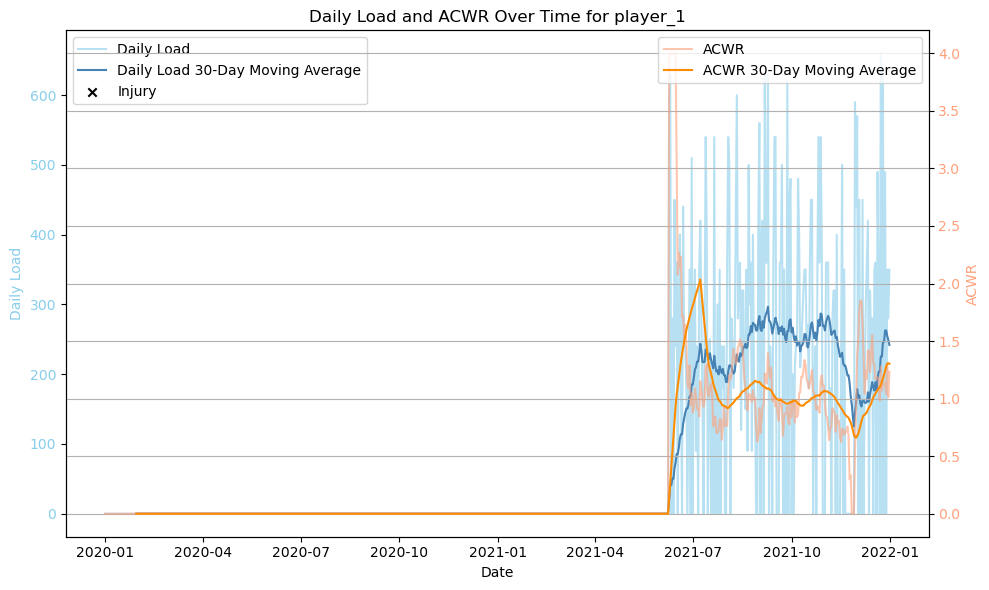

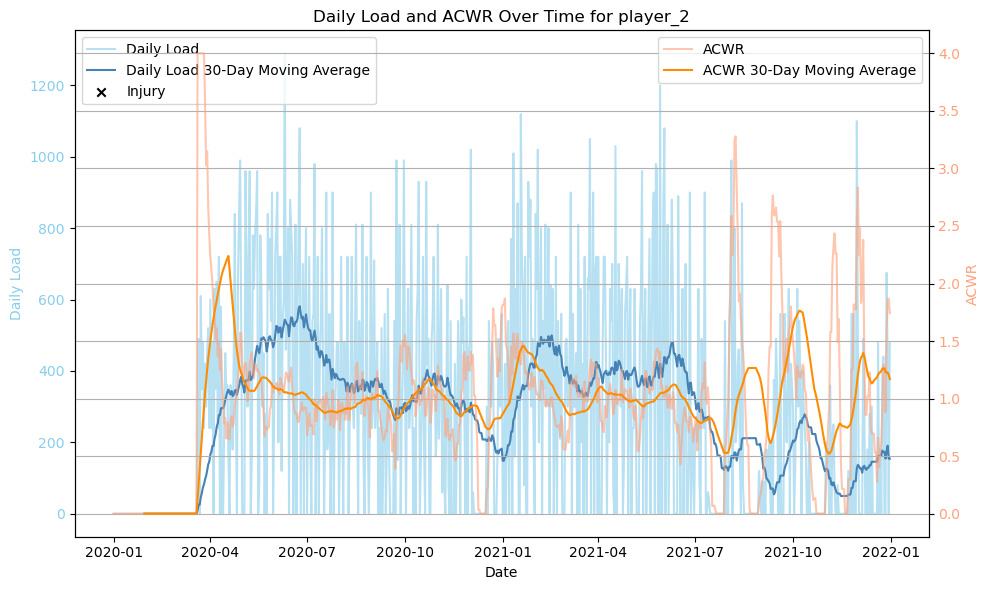

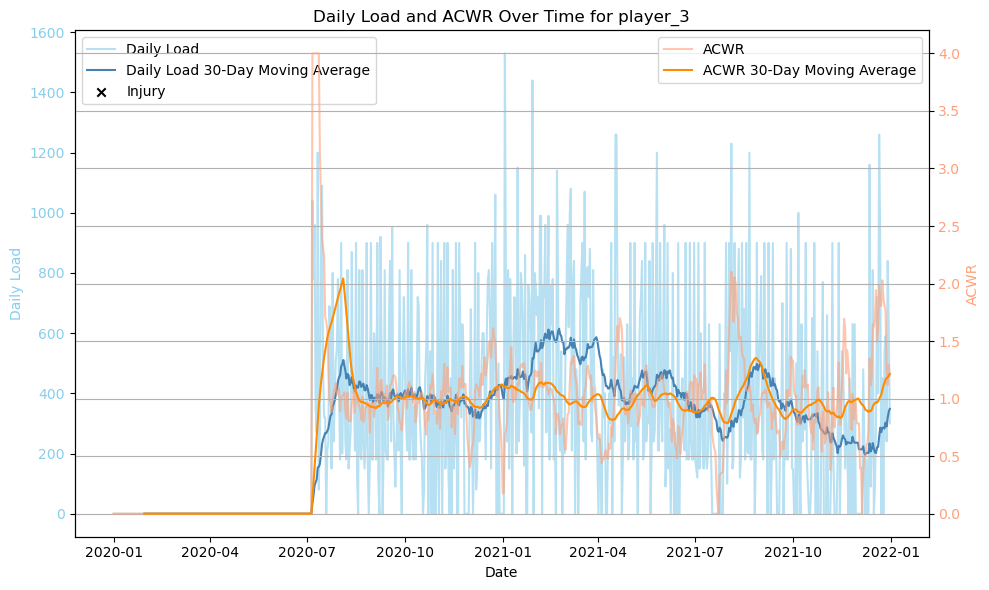

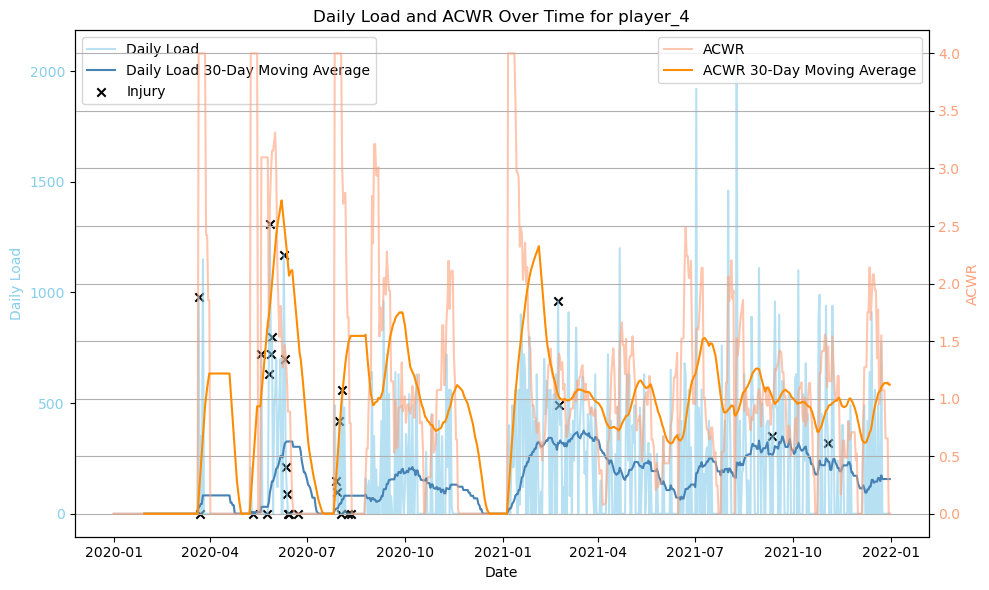

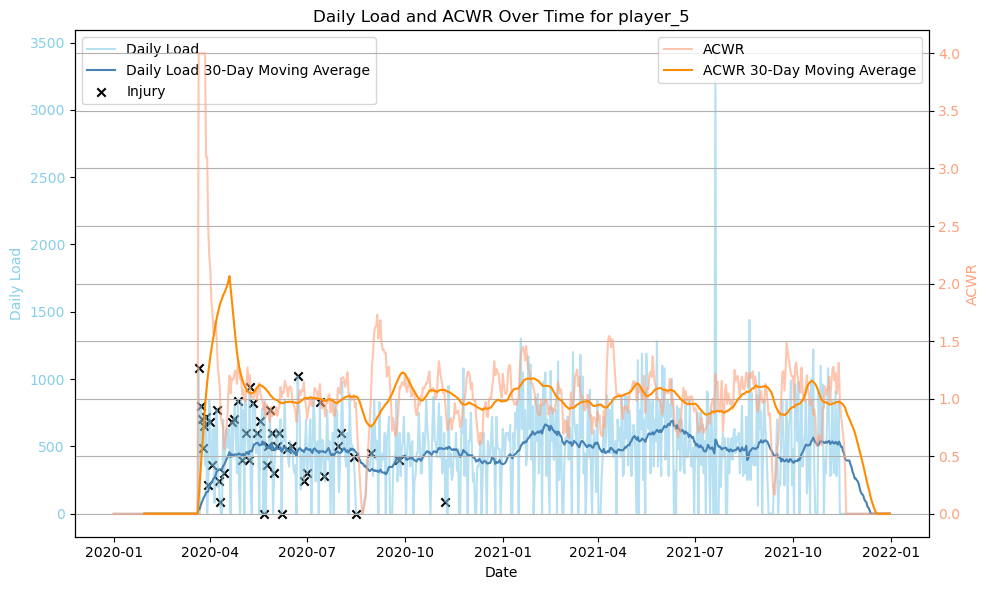

...

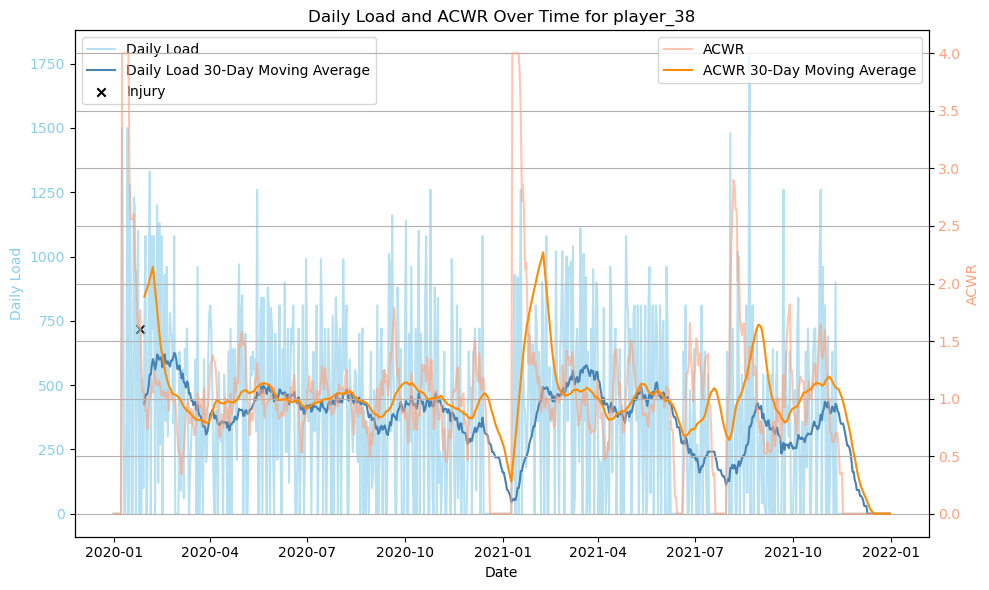

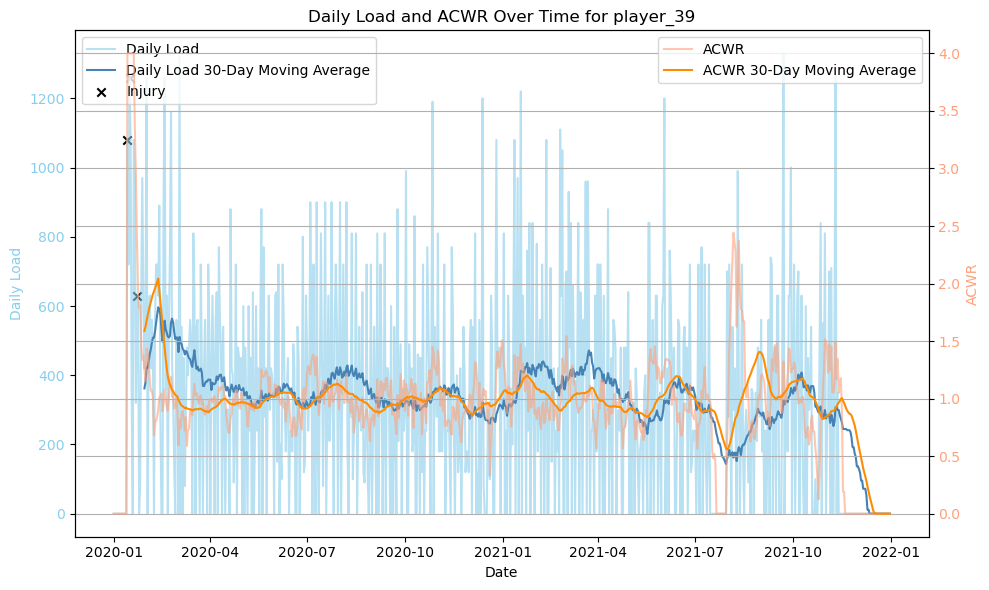

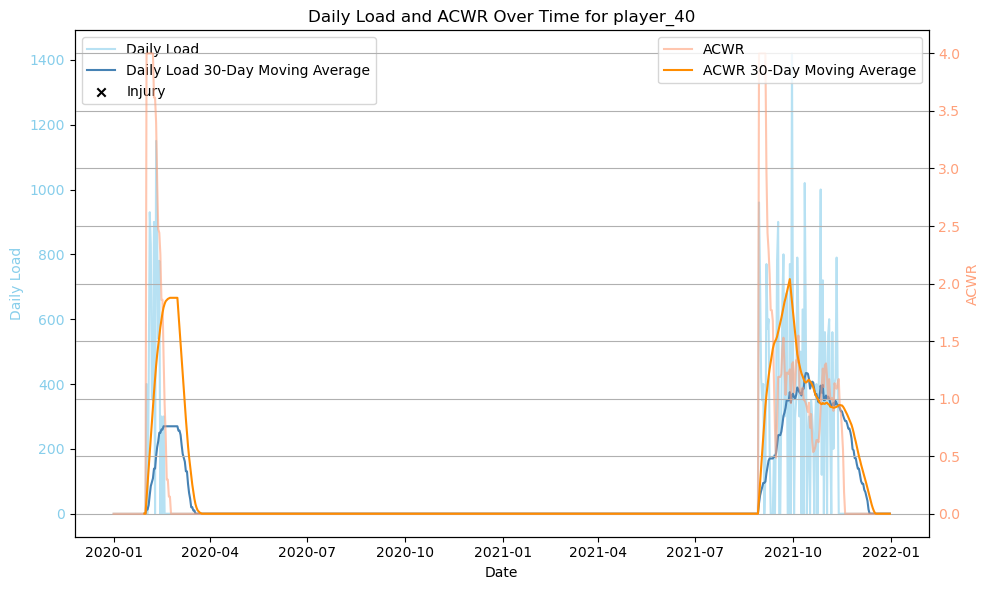

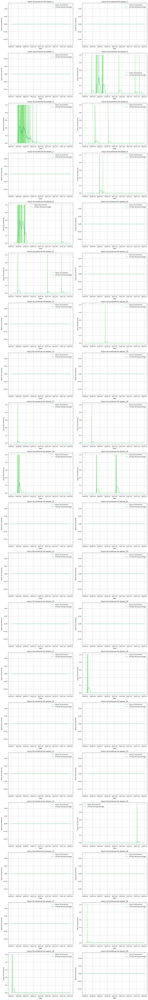

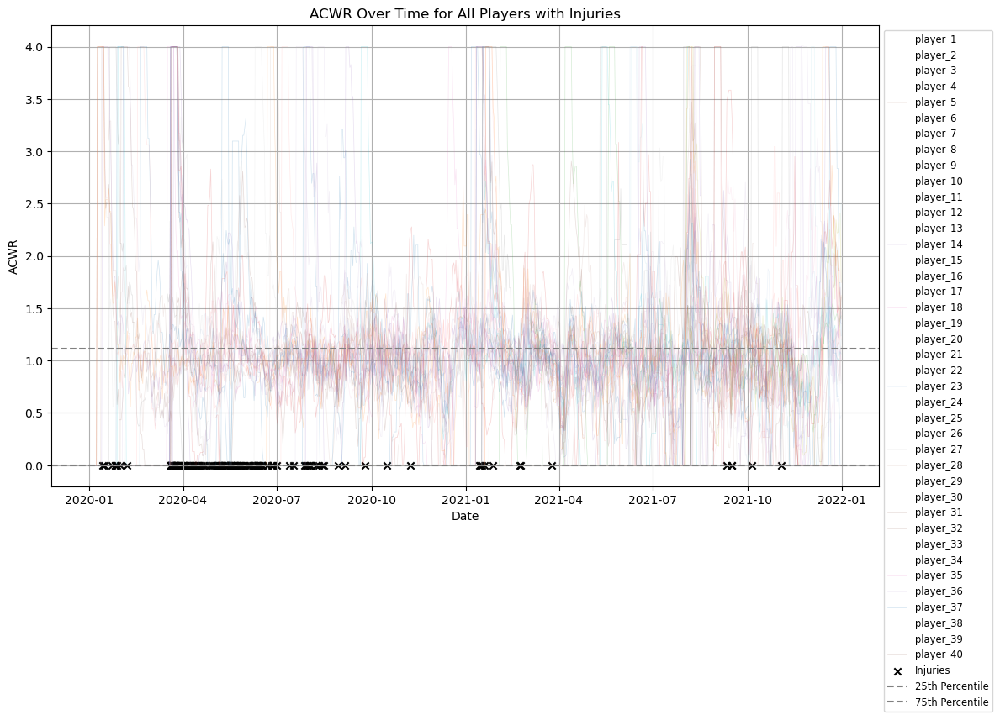

In [39]:

def visualize_player_data(df_dic):
    # Plot main plots for all players
    master_data = df_dic.copy()
    for player_id, player_df in master_data.items():
        # Ensure 'Date' column is datetime
        player_df.reset_index(drop=False, inplace=True)
        player_df['Date'] = pd.to_datetime(player_df['Date'])

        # Sort by date
        player_df.sort_values('Date', inplace=True)

        # Calculate moving average for injuries
        player_df['injury_moving_avg'] = player_df['injured'].rolling(window=30).mean()

        # Calculate moving average for ACWR
        player_df['acwr_moving_avg'] = player_df['acwr'].rolling(window=30).mean()

        # Calculate moving average for Daily Load
        player_df['daily_load_moving_avg'] = player_df['daily_load'].rolling(window=30).mean()

        # Plot Daily Load and ACWR with separate y-axes
        fig, ax1 = plt.subplots(figsize=(10, 6))
        ax1.plot(player_df['Date'], player_df['daily_load'], label='Daily Load', alpha=0.6, color='#87CEEB')
        ax1.plot(player_df['Date'], player_df['daily_load_moving_avg'], label='Daily Load 30-Day Moving Average', color='#4682B4')
        
        ax2 = ax1.twinx()
        ax2.plot(player_df['Date'], player_df['acwr'], label='ACWR', alpha=0.6, color='#FFA07A')
        ax2.plot(player_df['Date'], player_df['acwr_moving_avg'], label='ACWR 30-Day Moving Average', color='#FF8C00')
        
        # Add injury indications
        injury_dates = player_df[player_df['injured'] == 1]['Date']
        ax1.scatter(injury_dates, player_df.loc[player_df['Date'].isin(injury_dates), 'daily_load'], label='Injury', marker='x', color='black')
        
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Daily Load', color='#87CEEB')
        ax1.tick_params(axis='y', labelcolor='#87CEEB')
        ax1.legend(loc='upper left')
        
        ax2.set_ylabel('ACWR', color='#FFA07A')
        ax2.tick_params(axis='y', labelcolor='#FFA07A')
        ax2.legend(loc='upper right')
        
        plt.title(f'Daily Load and ACWR Over Time for {player_id}')
        plt.grid()

        plt.tight_layout()
        plt.show()


    player_ids = list(master_data.keys())
    num_players = len(player_ids)

    # Calculate the number of rows needed for the subplots
    num_rows = (num_players + 1) // 2  # Integer division to round up

    fig, axs = plt.subplots(num_rows, 2, figsize=(15, 5 * num_rows))  # Adjust figsize as needed
    axs = axs.flatten()  # Flatten the 2D array of axes for easy indexing

    for i in range(num_players):
        player_id = player_ids[i]
        player_df = master_data[player_id].copy()
        player_df.reset_index(drop=True, inplace=True)
        player_df['Date'] = pd.to_datetime(player_df['Date'])
        player_df.sort_values('Date', inplace=True)

        ax = axs[i]
        ax.plot(player_df['Date'], player_df['injured'], label='Injury Occurrences', alpha=0.6, color='#32CD32')
        ax.plot(player_df['Date'], player_df['injury_moving_avg'], label='30-Day Moving Average', color='#3CB371')
        ax.set_title(f'Injury Occurrences for {player_id}')
        ax.set_xlabel('Date')
        ax.set_ylabel('Injury Occurrences')
        ax.legend()
        ax.grid(True)

    # Remove any unused subplots if the number of players is odd
    if num_players % 2 != 0:
        fig.delaxes(axs[num_players])

    plt.tight_layout()
    plt.show()

    # Plot all players' ACWR over time with injuries and percentiles
    plt.figure(figsize=(12, 8))
    acwr_values = []
    injury_dates_all = []
    for player_id, player_df in master_data.items():
        player_df.reset_index(drop=True, inplace=True)
        player_df['Date'] = pd.to_datetime(player_df['Date'])
        player_df.sort_values('Date', inplace=True)
        plt.plot(player_df['Date'], player_df['acwr'], label=player_id, alpha=0.2, linewidth=0.5, color=plt.cm.tab20(np.random.randint(0, 20)))
        acwr_values.extend(player_df['acwr'])
        
        injury_dates = player_df[player_df['injured'] == 1]['Date']
        injury_dates_all.extend(injury_dates)
    
    plt.scatter(injury_dates_all, [0]*len(injury_dates_all), label='Injuries', marker='x', color='black')
    
    percentile_25 = np.percentile(acwr_values, 25)
    percentile_75 = np.percentile(acwr_values, 75)
    plt.axhline(y=percentile_25, color='gray', linestyle='--', label='25th Percentile')
    plt.axhline(y=percentile_75, color='gray', linestyle='--', label='75th Percentile')
    
    plt.title('ACWR Over Time for All Players with Injuries')
    plt.xlabel('Date')
    plt.ylabel('ACWR')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize='small')
    plt.grid()
    plt.tight_layout()
    plt.show()


# Example usage
visualize_player_data(player_data)


In [40]:
filtered_df_time 


,player_id,Date,acwr,atl,ctl28,ctl42,daily_load,monotony,strain,weekly_load,...,last_week_sleep_duration_avg,last_week_sleep_quality_avg,last_week_injured,time_idx,has_other,has_fever,has_coughing,has_soar throat,has_nausea,has_headache
6579,player_10,2020-01-01,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.000000,5.0,0,0,0,0,0,0,0,0
6580,player_10,2020-01-02,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.000000,5.0,0,1,0,0,0,0,0,0
6581,player_10,2020-01-03,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.000000,5.0,0,2,0,0,0,0,0,0
6582,player_10,2020-01-04,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.000000,5.0,0,3,0,0,0,0,0,0
6583,player_10,2020-01-05,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,8.000000,5.0,0,4,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6574,player_9,2021-12-27,0.0,0.0,45.000000,120.000000,0.0,0.0,0.0,0.0,...,8.000000,3.0,0,726,0,0,0,0,0,0
6575,player_9,2021-12-28,0.0,0.0,45.000000,110.000000,0.0,0.0,0.0,0.0,...,8.428571,3.0,0,727,0,0,0,0,0,0
6576,player_9,2021-12-29,0.0,0.0,27.142857,105.714286,0.0,0.0,0.0,0.0,...,8.285714,3.0,0,728,0,0,0,0,0,0
6577,player_9,2021-12-30,0.0,0.0,27.142857,105.714286,0.0,0.0,0.0,0.0,...,8.071429,3.0,0,729,0,0,0,0,0,0


In [41]:
player_data['player_1']

,player_id,Date,acwr,atl,ctl28,ctl42,daily_load,monotony,strain,weekly_load,...,daily_load_weekly_moving_avg,daily_load_monthly_moving_avg,last_night_sleep_Q,last_night_sleep_D,last_week_sleep_duration_avg,last_week_sleep_quality_avg,last_week_injured,injury_moving_avg,acwr_moving_avg,daily_load_moving_avg
0,player_1,2020-01-01,0.000000,0.00,0.00,0.00,0.0,0.00,0.0,0.0,...,0.000000,0.000000,0,0,8.500000,4.000000,0,NaN,NaN,NaN
1,player_1,2020-01-02,0.000000,0.00,0.00,0.00,0.0,0.00,0.0,0.0,...,0.000000,0.000000,1,1,8.500000,4.000000,0,NaN,NaN,NaN
2,player_1,2020-01-03,0.000000,0.00,0.00,0.00,0.0,0.00,0.0,0.0,...,0.000000,0.000000,1,1,8.500000,4.000000,0,NaN,NaN,NaN
3,player_1,2020-01-04,0.000000,0.00,0.00,0.00,0.0,0.00,0.0,0.0,...,0.000000,0.000000,1,1,8.500000,4.000000,0,NaN,NaN,NaN
4,player_1,2020-01-05,0.000000,0.00,0.00,0.00,0.0,0.00,0.0,0.0,...,0.000000,0.000000,1,1,8.500000,4.000000,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,player_1,2021-12-27,1.141266,297.14,260.36,212.86,490.0,1.07,2225.6,2080.0,...,297.142857,262.666667,1,1,8.785714,4.142857,0,0.0,1.245805,262.666667
727,player_1,2021-12-28,1.039446,254.29,244.64,207.86,0.0,0.85,1513.0,1780.0,...,254.285714,262.666667,1,1,8.714286,4.000000,0,0.0,1.280453,262.666667
728,player_1,2021-12-29,1.285063,304.29,236.79,204.29,350.0,1.09,2321.7,2130.0,...,304.285714,254.666667,1,1,8.785714,4.428571,0,0.0,1.305204,254.666667
729,player_1,2021-12-30,1.013007,250.00,246.79,210.95,280.0,1.05,1837.5,1750.0,...,250.000000,249.333333,1,1,8.642857,4.285714,0,0.0,1.307969,249.333333


In [42]:
full_df.acwr.quantile(0.95)

1.8919108732483663

In [43]:
np.average(full_df.acwr)

0.7488392083540919

In [44]:
player_df_cleaned = full_df.drop(columns=['player_id', 'Date', 'problems','fatigue_missing','mood_missing','readiness_missing','sleep_duration_missing',
                                            'sleep_quality_missing','soreness_missing','stress_missing','injured'])


In [45]:
correlation_matrix = player_df_cleaned.corr()
print(correlation_matrix)


                                   acwr       atl     ctl28     ctl42  \
acwr                           1.000000  0.651319  0.412851  0.387065   
atl                            0.651319  1.000000  0.884374  0.844659   
ctl28                          0.412851  0.884374  1.000000  0.976838   
ctl42                          0.387065  0.844659  0.976838  1.000000   
daily_load                     0.456349  0.648747  0.560120  0.535318   
monotony                       0.595166  0.871782  0.809475  0.783480   
strain                         0.507934  0.892990  0.774163  0.738683   
weekly_load                    0.650375  0.999433  0.884396  0.844971   
fatigue                       -0.203755 -0.260662 -0.277983 -0.282584   
mood                          -0.115470 -0.139102 -0.167890 -0.179594   
readiness                     -0.143308 -0.149905 -0.178245 -0.186449   
sleep_duration                 0.063901  0.096521  0.086140  0.077478   
sleep_quality                  0.031448  0.013654  

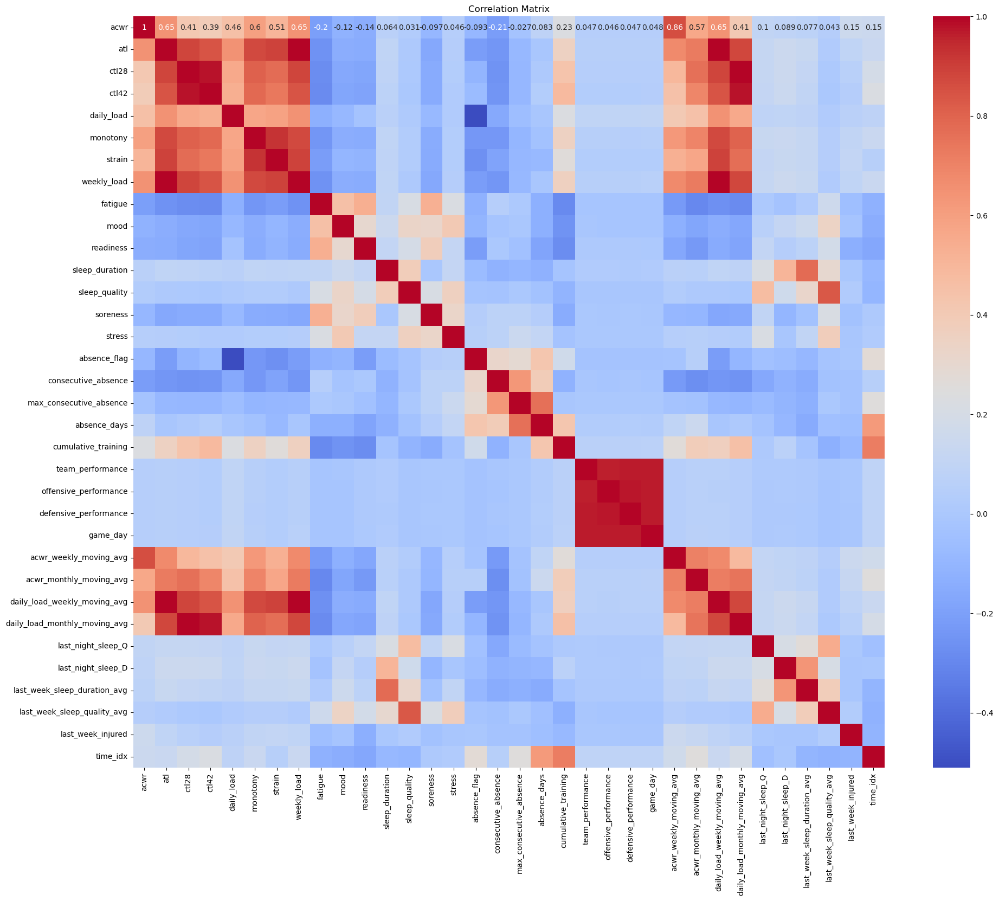

In [46]:

plt.figure(figsize=(23, 18))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', square=True)
plt.title('Correlation Matrix')
plt.show()


In [47]:
full_df_no_missing.columns

Index(['player_id', 'Date', 'acwr', 'atl', 'ctl28', 'ctl42', 'daily_load',
       'monotony', 'strain', 'weekly_load', 'fatigue', 'mood', 'readiness',
       'sleep_duration', 'sleep_quality', 'soreness', 'stress', 'injured',
       'absence_flag', 'consecutive_absence', 'max_consecutive_absence',
       'absence_days', 'cumulative_training', 'problems', 'team_performance',
       'offensive_performance', 'defensive_performance', 'game_day',
       'acwr_weekly_moving_avg', 'acwr_monthly_moving_avg',
       'daily_load_weekly_moving_avg', 'daily_load_monthly_moving_avg',
       'last_night_sleep_Q', 'last_night_sleep_D',
       'last_week_sleep_duration_avg', 'last_week_sleep_quality_avg',
       'last_week_injured', 'time_idx', 'has_other', 'has_fever',
       'has_coughing', 'has_soar throat', 'has_nausea', 'has_headache'],
      dtype='object')

## Training models

### Weekly prediction model - timeserise (LSTM)

Fold 1...
Insufficient samples (10) for lookback window (14).
Skipping Fold 1 due to insufficient sequences.
Fold 2...
Epoch 1/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.4376 - Precision: 0.0000e+00 - Recall: 0.0000e+00 - loss: 2.0158 - val_AUC: 0.4551 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_loss: 0.1033
Epoch 2/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.4982 - Precision: 0.0000e+00 - Recall: 0.0000e+00 - loss: 0.9516 - val_AUC: 0.6230 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_loss: 0.1051
Epoch 3/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.4165 - Precision: 0.0000e+00 - Recall: 0.0000e+00 - loss: 1.7989 - val_AUC: 0.5298 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_loss: 0.2704
Epoch 4/100
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.3417 - Precision: 0.0000e+00 - Recall: 0.0000e+00 - loss: 2.0917 - val_AUC: 0.4754 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_loss: 0.3580
Epoch 5/100
1

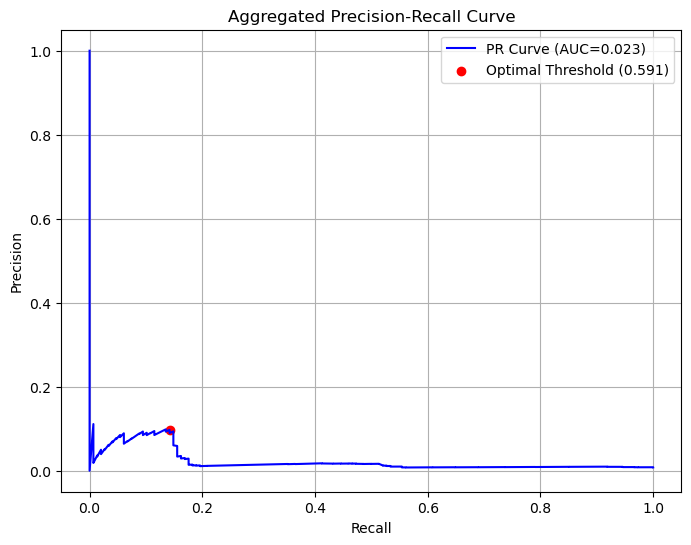

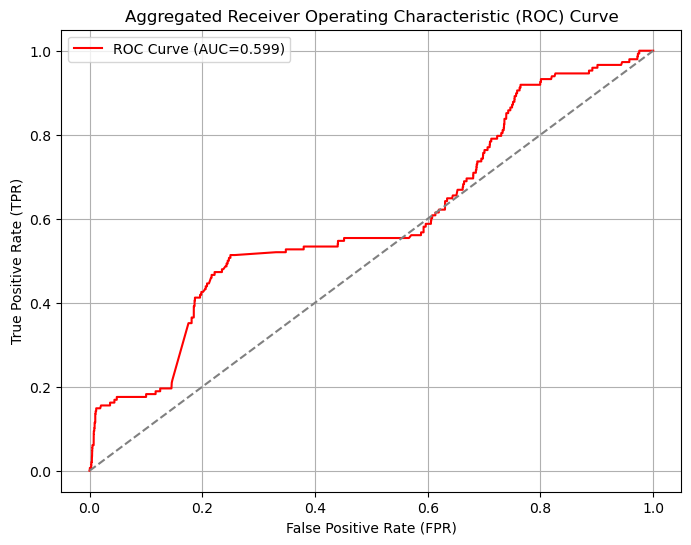

In [124]:
# Weekly model implementation
# 1. Temporal Data Preparation
def create_sequences(data, features, lookback=14):
    """Create 3D tensors for LSTM input with proper temporal alignment."""
    if len(data) < lookback:  # Skip if there are not enough samples
        print(f"Insufficient samples ({len(data)}) for lookback window ({lookback}).")
        return np.empty((0, lookback, len(features))), np.empty((0,))
    
    sequences = []
    labels = []
    players = data['player_id'].unique()
    
    for player in players:
        player_data = data[data['player_id'] == player].sort_values('time_idx')
        player_values = player_data[features].values
        player_targets = player_data['injured'].values
        
        # Predict injury in the following 7 days (horizon=7)
        for i in range(lookback, len(player_data)):
            sequences.append(player_values[i-lookback:i])
            labels.append(player_targets[i])  # Predict current day
    
    return np.array(sequences), np.array(labels)


# 2. Player-Specific Scaler (No Data Leakage)
class PlayerSpecificScaler:
    """Scale data per player while preserving temporal relationships."""
    def __init__(self):
        self.scalers = {}  # Store scalers per player
        
    def fit_transform(self, data, features):
        scaled_data = data.copy()
        for player in data['player_id'].unique():
            player_mask = data['player_id'] == player
            scaler = StandardScaler()
            scaled_data.loc[player_mask, features] = scaler.fit_transform(data.loc[player_mask, features])
            self.scalers[player] = scaler
        return scaled_data
    
    def transform(self, data, features):
        scaled_data = data.copy()
        for player in data['player_id'].unique():
            if player in self.scalers:
                player_mask = data['player_id'] == player
                scaled_data.loc[player_mask, features] = self.scalers[player].transform(data.loc[player_mask, features])
        return scaled_data

# 3. Enhanced LSTM Architecture

def build_lstm_model(input_shape):
    """Build and compile the LSTM model."""
    model = Sequential([
        Input(shape=input_shape),  # Explicitly define input shape
        LSTM(64, return_sequences=False),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    
    model.compile(
        loss='binary_crossentropy',
        optimizer='adam',
        metrics=['AUC', 'Precision', 'Recall']
    )
    return model


def disjoint_time_series_split(X, n_splits=5, min_train_size=10):
    """
    Custom TimeSeriesSplit ensuring disjoint test sets.
    Ensures all folds have valid training and test sets.
    """
    data_size = len(X)
    fold_size = data_size // n_splits  # Calculate the size of each fold

    splits = []
    for fold_idx in range(n_splits):
        train_end = max(min_train_size, fold_idx * fold_size)  # Ensure minimum training size
        test_start = train_end
        test_end = test_start + fold_size

        train_indices = np.arange(0, train_end)
        test_indices = np.arange(test_start, min(test_end, data_size))

        # Skip folds with insufficient data
        if len(train_indices) < min_train_size or len(test_indices) == 0:
            print(f"Skipping Fold {fold_idx + 1} due to insufficient data.")
            continue

        splits.append((train_indices, test_indices))

    return splits






def temporal_cross_validate(data, features, lookback=14):
    splits = disjoint_time_series_split(np.arange(len(data)), n_splits=5)
    
    pr_aucs, roc_aucs, precisions, recalls, f1_scores = [], [], [], [], []
    all_y_test = []  # To store all true labels across folds
    all_y_pred_prob = []  # To store all predicted probabilities across folds
    
    for fold_idx, (train_indices, test_indices) in enumerate(splits):
        print(f"Fold {fold_idx + 1}...")
        
        train_data = data.iloc[train_indices]
        test_data = data.iloc[test_indices]

        X_train, y_train = create_sequences(train_data, features, lookback=lookback)
        X_test, y_test = create_sequences(test_data, features, lookback=lookback)

        # Validate shapes before passing to model
        if X_train.shape[0] == 0 or X_test.shape[0] == 0:
            print(f"Skipping Fold {fold_idx + 1} due to insufficient sequences.")
            continue

        if sum(y_train) == 0:
            print(f"Warning: No positive samples in training set for Fold {fold_idx + 1}.")
            class_weight = {0: 1., 1: 0.}
        else:
            class_weight = {0: 1., 1: len(y_train) / sum(y_train)}

        model = build_lstm_model((lookback, len(features)))
        
        history = model.fit(
            X_train,
            y_train,
            epochs=100,
            batch_size=32,
            class_weight=class_weight,
            validation_data=(X_test, y_test),
            callbacks=[EarlyStopping(patience=10)],
            verbose=1,
        )
        
        # Generate predictions on the test set
        y_pred_prob_fold = model.predict(X_test).flatten()
        
        # Save predictions and true labels for later aggregation
        all_y_test.extend(y_test.flatten())
        all_y_pred_prob.extend(y_pred_prob_fold)

        # Calculate metrics for this fold
        pr_auc_fold = average_precision_score(y_test.flatten(), y_pred_prob_fold)
        roc_auc_fold = roc_auc_score(y_test.flatten(), y_pred_prob_fold)
        
        precision_fold = precision_score(y_test.flatten(), (y_pred_prob_fold >= 0.5).astype(int), zero_division=0)
        recall_fold = recall_score(y_test.flatten(), (y_pred_prob_fold >= 0.5).astype(int), zero_division=0)
        f1_fold = f1_score(y_test.flatten(), (y_pred_prob_fold >= 0.5).astype(int), zero_division=0)
        
        pr_aucs.append(pr_auc_fold)
        roc_aucs.append(roc_auc_fold)
        precisions.append(precision_fold)
        recalls.append(recall_fold)
        f1_scores.append(f1_fold)

        # Print metrics for this fold
        print(f"PR-AUC: {pr_auc_fold:.3f}, ROC-AUC: {roc_auc_fold:.3f}, Precision: {precision_fold:.3f}, Recall: {recall_fold:.3f}, F1-Score: {f1_fold:.3f}")

    # Aggregate metrics across folds
    if len(pr_aucs) > 0:
        print("\nAggregate Performance Across Folds:")
        print(f"Mean PR-AUC: {np.mean(pr_aucs):.3f} ± {np.std(pr_aucs):.3f}")
        print(f"Mean ROC-AUC: {np.mean(roc_aucs):.3f} ± {np.std(roc_aucs):.3f}")
        print(f"Mean Precision: {np.mean(precisions):.3f} ± {np.std(precisions):.3f}")
        print(f"Mean Recall: {np.mean(recalls):.3f} ± {np.std(recalls):.3f}")
        print(f"Mean F1-Score: {np.mean(f1_scores):.3f} ± {np.std(f1_scores):.3f}")
        

    
    # Calculate optimal threshold using Precision-Recall Curve
    if len(all_y_test) > 0 and len(all_y_pred_prob) > 0:
        precision_all, recall_all, thresholds_all = precision_recall_curve(all_y_test, all_y_pred_prob)
        f1_scores_all = 2 * (precision_all * recall_all) / (precision_all + recall_all + 1e-7)
        
        best_threshold_index = np.argmax(f1_scores_all)
        best_threshold = thresholds_all[best_threshold_index]
        print(f"Optimal Threshold: {best_threshold:.3f} (F1-Score={f1_scores_all[best_threshold_index]:.3f})")
        
        final_y_test = np.array(all_y_test)
        final_y_pred_prob = np.array(all_y_pred_prob)

        y_pred_bin_final = (final_y_pred_prob >= best_threshold).astype(int)
        final_cm = confusion_matrix(final_y_test, y_pred_bin_final)

        print("\nFinal Confusion Matrix at Optimal Threshold:")
        print(final_cm)




    # Plot aggregated Precision-Recall Curve with optimal threshold
    plt.figure(figsize=(8, 6))
    plt.plot(recall_all, precision_all, label=f'PR Curve (AUC={average_precision_score(all_y_test, all_y_pred_prob):.3f})', color='blue')
    plt.scatter(recall_all[best_threshold_index], precision_all[best_threshold_index], color='red', label=f'Optimal Threshold ({best_threshold:.3f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Aggregated Precision-Recall Curve')
    plt.legend()
    plt.grid()
    plt.show()
    
    # Plot aggregated ROC Curve
    fpr_all, tpr_all, _ = roc_curve(all_y_test, all_y_pred_prob)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr_all, tpr_all, label=f'ROC Curve (AUC={roc_auc_score(all_y_test, all_y_pred_prob):.3f})', color='red')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')  # Diagonal line for random guessing
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.title('Aggregated Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.grid()
    plt.show()



# Main Execution Block with Evaluation Integration
if __name__ == "__main__":
    try:
        # Define features and parameters
        temporal_features = [
            'daily_load', 'acwr', 'sleep_duration', 
            'sleep_quality', 'strain', 'ctl28'
        ]
        
        lookback_window = 14
        
        # Load and preprocess data `filtered_df_time` 
        data = filtered_df_time.copy()  #
        
        # Perform temporal cross-validation and evaluate performance across folds
        temporal_cross_validate(data.copy(), temporal_features.copy(), lookback=lookback_window)

    except Exception as e:
         print(f"[!] Error encountered during execution: {str(e)}")




In [103]:
from sklearn.model_selection import TimeSeriesSplit
import numpy as np


data_size = 23392
X = np.arange(data_size)  # Simulated feature indices

# Run the custom split function
splits = disjoint_time_series_split(X, n_splits=5)

# Print train/test indices for each fold
for fold_idx, (train_indices, test_indices) in enumerate(splits):
    print(f"Fold {fold_idx + 1}:")
    print(f"Train indices: {train_indices[:10]} ... {len(train_indices)} samples")
    print(f"Test indices: {test_indices[:10]} ... {len(test_indices)} samples")


Fold 1:
Train indices: [] ... 0 samples
Test indices: [0 1 2 3 4 5 6 7 8 9] ... 4678 samples
Fold 2:
Train indices: [0 1 2 3 4 5 6 7 8 9] ... 4678 samples
Test indices: [4678 4679 4680 4681 4682 4683 4684 4685 4686 4687] ... 4678 samples
Fold 3:
Train indices: [0 1 2 3 4 5 6 7 8 9] ... 9356 samples
Test indices: [9356 9357 9358 9359 9360 9361 9362 9363 9364 9365] ... 4678 samples
Fold 4:
Train indices: [0 1 2 3 4 5 6 7 8 9] ... 14034 samples
Test indices: [14034 14035 14036 14037 14038 14039 14040 14041 14042 14043] ... 4678 samples
Fold 5:
Train indices: [0 1 2 3 4 5 6 7 8 9] ... 18712 samples
Test indices: [18712 18713 18714 18715 18716 18717 18718 18719 18720 18721] ... 4678 samples


In [115]:
filtered_df_time

,player_id,Date,acwr,atl,ctl28,ctl42,daily_load,monotony,strain,weekly_load,...,time_idx,has_other,has_fever,has_coughing,has_soar throat,has_nausea,has_headache,rest_day,last_rest_day,time_since_last_rest
6579,player_10,2020-01-01,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,NaN,9999.0
6580,player_10,2020-01-02,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,NaN,9999.0
6581,player_10,2020-01-03,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,2,0,0,0,0,0,0,0,NaN,9999.0
6582,player_10,2020-01-04,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,3,0,0,0,0,0,0,0,NaN,9999.0
6583,player_10,2020-01-05,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,4,0,0,0,0,0,0,0,NaN,9999.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6574,player_9,2021-12-27,0.0,0.0,45.000000,120.000000,0.0,0.0,0.0,0.0,...,726,0,0,0,0,0,0,1,726.0,0.0
6575,player_9,2021-12-28,0.0,0.0,45.000000,110.000000,0.0,0.0,0.0,0.0,...,727,0,0,0,0,0,0,1,727.0,0.0
6576,player_9,2021-12-29,0.0,0.0,27.142857,105.714286,0.0,0.0,0.0,0.0,...,728,0,0,0,0,0,0,1,728.0,0.0
6577,player_9,2021-12-30,0.0,0.0,27.142857,105.714286,0.0,0.0,0.0,0.0,...,729,0,0,0,0,0,0,1,729.0,0.0


### Static Models (Instant and One-Day)

In [84]:
def split_data(df,outcome,RANDOM_STATE,column_to_remove, test_proportion = 0.2):
    # Define outcome and features
    # feature_cols = [col for col in discretized_FATCHD_p.columns if col not in [outcomes, 'ID_C']]
    feature_cols = [col for col in df.columns if col not in column_to_remove]
    
    
    print(f"\n==== Outcome: {outcome} ====")
    X = df[feature_cols]
    y = df[outcome]
    
    # 50/50 train/test split, stratified to preserve imbalance ratios in both sets
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=test_proportion, 
        random_state=RANDOM_STATE, 
        stratify=y
    )
    return X_train, X_test, y_train, y_test

def evaluate_and_visualize_model(model, X_test, y_test):
    """
    Evaluate model performance with ROC, PR curves, confusion matrices,
    and show the best F1 threshold on the PR plot.
    """
    # Get predictions and probabilities
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Calculate confusion matrix (default threshold=0.5)
    cm_default = confusion_matrix(y_test, y_pred)
    
    # Print default threshold confusion matrix
    print("\nConfusion Matrix (Default Threshold = 0.5):")
    print("                 Predicted")
    print("                 Class 0  Class 1")
    print(f"Actual Class 0:  {cm_default[0,0]:6d}  {cm_default[0,1]:6d}")
    print(f"Actual Class 1:  {cm_default[1,0]:6d}  {cm_default[1,1]:6d}")

    # Calculate Precision-Recall curve
    precision, recall, pr_thresholds = precision_recall_curve(y_test, y_pred_proba)
    
    # Compute F1 scores for each threshold
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-8)

    # Find the threshold with the highest F1
    optimal_idx = np.argmax(f1_scores)
    # If the optimal index is the last point, threshold can be artificially 1.0,
    # but we check if it is within the length of pr_thresholds
    if optimal_idx < len(pr_thresholds):
        optimal_threshold = pr_thresholds[optimal_idx]
    else:
        optimal_threshold = 1.0
    
    best_f1_score = f1_scores[optimal_idx]

    # Calculate confusion matrix with the optimal threshold
    y_pred_optimal = (y_pred_proba >= optimal_threshold).astype(int)
    cm_optimal = confusion_matrix(y_test, y_pred_optimal)
    
    # Print optimal threshold confusion matrix
    print(f"\nConfusion Matrix (Optimal Threshold = {optimal_threshold:.3f}):")
    print("                 Predicted")
    print("                 Class 0  Class 1")
    print(f"Actual Class 0:  {cm_optimal[0,0]:6d}  {cm_optimal[0,1]:6d}")
    print(f"Actual Class 1:  {cm_optimal[1,0]:6d}  {cm_optimal[1,1]:6d}")

    # Create ROC and PR curves plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    fpr, tpr, roc_thresholds = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    ax1.plot(fpr, tpr, label=f'ROC (AUC = {roc_auc:.3f})', color='blue')
    ax1.plot([0, 1], [0, 1], 'k--', label='Random')
    ax1.set_title('ROC Curve')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.legend()
    ax1.grid(True)

    # PR Curve
    pr_auc = average_precision_score(y_test, y_pred_proba)
    ax2.plot(recall, precision, label=f'PR (AUC = {pr_auc:.3f})', color='green')
    
    # Plot the point for the best F1 threshold
    ax2.scatter(recall[optimal_idx], precision[optimal_idx],
                color='red',
                label=(f'Optimal F1 = {best_f1_score:.3f}\n'
                       f'Threshold = {optimal_threshold:.3f}'))
    
    ax2.set_title('Precision-Recall Curve')
    ax2.set_xlabel('Recall')
    ax2.set_ylabel('Precision')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

    # Print out the best F1 score
    print(f"\nBest F1 Score from PR curve: {best_f1_score:.4f}")

    return {
        'roc_auc': roc_auc,
        'pr_auc': pr_auc,
        'optimal_threshold': optimal_threshold,
        'best_f1_score': best_f1_score,
        'default_cm': cm_default,
        'optimal_cm': cm_optimal}

#### ML Functions #####
def train_models(X_train, y_train, RANDOM_STATE=0):
    """Train models with proper error handling and cross-validation"""
    models = {}
    
    # KNN with K tuning plot

    # KNN with K tuning plot
    knn_params = {'n_neighbors': np.arange(1, 80)}
    knn_grid = GridSearchCV(KNeighborsClassifier(), knn_params, 
                           scoring='average_precision', cv=5)
    knn_grid.fit(X_train, y_train)
    best_k = knn_grid.best_params_['n_neighbors']
    
    # Plot KNN performance
    plt.figure(figsize=(10,6))
    plt.plot(knn_params['n_neighbors'], knn_grid.cv_results_['mean_test_score'])
    plt.title('KNN Performance vs Number of Neighbors')
    plt.xlabel('Number of Neighbors (K)')
    plt.ylabel('PR-AUC Score')
    plt.axvline(best_k, color='r', linestyle='--', label=f'Best K = {best_k}')
    plt.legend()
    plt.show()

    # Fit KNN with best parameters
    best_knn = KNeighborsClassifier(n_neighbors=best_k)
    best_knn.fit(X_train, y_train)
    models['KNN'] = best_knn

    print(f"Best K for KNN: {best_k}")

    # RuleFit with updated parameters
    models['RuleFit200'] = RuleFitClassifier(
        max_rules=200,
        tree_size=4,
        n_estimators=1500,
        memory_par=0.001,
        sample_fract=0.5,
        include_linear=False,
        random_state=RANDOM_STATE
    ).fit(X_train.values, y_train.values)  # Convert to numpy arrays

    # Random Forest
    models['Random Forest300'] = RandomForestClassifier(
        n_estimators=300, 
        bootstrap=True, 
        # max_depth=4,
        max_features='log2',
        min_samples_leaf=1,
        min_samples_split=10,
        random_state=RANDOM_STATE
    ).fit(X_train, y_train)

        # Random Forest
    models['Random Forest800'] = RandomForestClassifier(
        n_estimators=800, 
        bootstrap=True, 
        # max_depth=4,
        max_features='log2',
        min_samples_leaf=1,
        min_samples_split=10,
        random_state=RANDOM_STATE
    ).fit(X_train, y_train)

        # Random Forest
    models['Random Forest1200'] = RandomForestClassifier(
        n_estimators=1200, 
        bootstrap=True, 
        # max_depth=4,
        max_features='log2',
        min_samples_leaf=1,
        min_samples_split=10,
        random_state=RANDOM_STATE
    ).fit(X_train, y_train)

    # # Gradient Boosting
    # models['Gradient Boosting'] = GradientBoostingClassifier(
    #     n_estimators=800,
    #     learning_rate=0.01,
    #     max_depth=4,
    #     random_state=RANDOM_STATE
    # ).fit(X_train, y_train)

                # XGBoost
    models['XGBoost300'] = XGBClassifier(
        colsample_bytree=1.0,
        gamma=0.2,
        learning_rate=0.01,
        max_depth=3,
        min_child_weight=1,
        n_estimators=300,
        scale_pos_weight=1,
        subsample=0.8,
        random_state=RANDOM_STATE
    ).fit(X_train, y_train)
    # XGBoost
    models['XGBoost800'] = XGBClassifier(
        colsample_bytree=1.0,
        gamma=0.2,
        learning_rate=0.01,
        max_depth=3,
        min_child_weight=1,
        n_estimators=800,
        scale_pos_weight=1,
        subsample=0.8,
        random_state=RANDOM_STATE
    ).fit(X_train, y_train)
    

        # XGBoost
    models['XGBoost1500'] = XGBClassifier(
        colsample_bytree=1.0,
        gamma=0.2,
        learning_rate=0.01,
        max_depth=3,
        min_child_weight=1,
        n_estimators=1500,
        scale_pos_weight=1,
        subsample=0.8,
        random_state=RANDOM_STATE
    ).fit(X_train, y_train)



        # Logistic Regression
    models['Logistic Regression'] = LogisticRegression(
        random_state=RANDOM_STATE,
        max_iter=10000  # Increase max_iter if the model doesn't converge
    ).fit(X_train, y_train)

    return models

def evaluate_model(model, X_train, y_train, X_test, y_test):
    """Calculate metrics with optimal threshold F1 in cross-validation"""
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = {
        'roc_auc': [],
        'pr_auc': [],
        'f1': [],
        'thresholds': []
    }

    for train_idx, val_idx in cv.split(X_train, y_train):
        X_fold_train, X_fold_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_fold_train, y_fold_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
        
        fold_model = clone(model).fit(X_fold_train, y_fold_train)
        y_proba_val = fold_model.predict_proba(X_fold_val)[:, 1]
        
        # Calculate ROC AUC and PR AUC
        cv_scores['roc_auc'].append(roc_auc_score(y_fold_val, y_proba_val))
        cv_scores['pr_auc'].append(average_precision_score(y_fold_val, y_proba_val))
        
        # Optimize threshold
        precision, recall, thresholds = precision_recall_curve(y_fold_val, y_proba_val)
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-8)
        optimal_idx = np.argmax(f1_scores)
        optimal_threshold = thresholds[optimal_idx]
        
        y_pred_optimal = (y_proba_val >= optimal_threshold).astype(int)
        cv_scores['f1'].append(f1_score(y_fold_val, y_pred_optimal))
        cv_scores['thresholds'].append(optimal_threshold)

    # Train final model on full training data
    final_model = clone(model).fit(X_train, y_train)
    
    # Use mean of CV thresholds for final prediction
    final_threshold = np.mean(cv_scores['thresholds'])
    
    # Test set evaluation
    y_proba_test = final_model.predict_proba(X_test)[:, 1]
    y_pred_optimal_test = (y_proba_test >= final_threshold).astype(int)

    return {
        'CV ROC AUC': np.mean(cv_scores['roc_auc']),
        'CV PR AUC': np.mean(cv_scores['pr_auc']),
        'CV F1 (Optimal)': np.mean(cv_scores['f1']),
        'Test ROC AUC': roc_auc_score(y_test, y_proba_test),
        'Test PR AUC': average_precision_score(y_test, y_proba_test),
        'Test F1 (Optimal)': f1_score(y_test, y_pred_optimal_test),
        'Optimal Threshold': final_threshold,
        'Probability Scores': y_proba_test
    }

def plot_model_comparison(results_df, y_test, exclude_models=None):
    """
    Generate rich comparison plots with error handling and model exclusion option.
    
    Parameters:
    - results_df: DataFrame containing model results
    - y_test: True labels for the test set
    - exclude_models: List of model names to exclude from plotting (default: None)
    """
    # Check required columns
    required_cols = ['Probability Scores', 'Test ROC AUC', 'Test PR AUC', 'Test F1 (Optimal)', 'Optimal Threshold']
    missing = [col for col in required_cols if col not in results_df.columns]
    
    if missing:
        print(f"Missing columns for plotting: {missing}")
        print("Available columns:", results_df.columns.tolist())
        return
    
    # Filter out excluded models
    if exclude_models:
        results_df = results_df[~results_df.index.isin(exclude_models)]
    
    fig, axes = plt.subplots(1, 3, figsize=(25, 8))
    
    # 1. ROC Curves
    axes[0].plot([0, 1], [0, 1], 'k--', alpha=0.5, label='Random')
    for idx, row in results_df.iterrows():
        try:
            fpr, tpr, _ = roc_curve(y_test, row['Probability Scores'])
            roc_auc = row['Test ROC AUC']
            axes[0].plot(fpr, tpr, lw=2, 
                         label=f"{idx} (AUC = {roc_auc:.3f})")
        except Exception as e:
            print(f"Error plotting ROC for {idx}: {str(e)}")
    
    axes[0].set(xlabel='False Positive Rate', ylabel='True Positive Rate', 
               title='ROC Curves Comparison\n(Higher AUC = Better Performance)')
    axes[0].legend(loc='lower right', fontsize=9)
    axes[0].grid(alpha=0.3)
    
    # 2. PR Curves
    baseline = y_test.mean()
    axes[1].axhline(baseline, color='k', linestyle='--', alpha=0.5, label='Baseline')
    for idx, row in results_df.iterrows():
        try:
            precision, recall, _ = precision_recall_curve(y_test, row['Probability Scores'])
            pr_auc = row['Test PR AUC']
            axes[1].plot(recall, precision, lw=2,
                         label=f"{idx} (AP = {pr_auc:.3f})")
        except Exception as e:
            print(f"Error plotting PR for {idx}: {str(e)}")
    
    axes[1].set(xlabel='Recall', ylabel='Precision', 
               title='Precision-Recall Curves Comparison')
    axes[1].legend(loc='upper right', fontsize=9)
    axes[1].grid(alpha=0.3)
    
    # 3. F1 Scores with Thresholds
    results_df = results_df.sort_values('Test F1 (Optimal)', ascending=False)
    bars = axes[2].bar(results_df.index, results_df['Test F1 (Optimal)'], 
                      color='purple', alpha=0.7)
    
    # Add threshold annotations
    for bar, (idx, row) in zip(bars, results_df.iterrows()):
        height = bar.get_height()
        axes[2].text(bar.get_x() + bar.get_width()/2., height-0.05,
                    f"Thresh: {row['Optimal Threshold']:.3f}\nF1: {height:.3f}",
                    ha='center', va='bottom', fontsize=9)
    
    axes[2].set(title='Optimal F1 Scores with Decision Thresholds\n(Higher = Better)',
               ylabel='F1 Score', ylim=(0, 1.1))
    axes[2].tick_params(axis='x', rotation=45)
    axes[2].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

def plot_model_information(all_models, X_test, tree_based_lists):
    """
    Plots feature importance and other relevant visuals for each model in the provided list of models.

    Parameters:
    - all_models: dict, a dictionary of trained models with model names as keys.
    - X_test: DataFrame, the test dataset used for feature names.
    """
    for model_name, model in all_models.items():
        try:
            if model_name in tree_based_lists:
                # Feature importance for tree-based models
                if hasattr(model, 'feature_importances_'):
                    importances = model.feature_importances_
                    indices = np.argsort(importances)[::-1]  # Sort feature importances in descending order

                    # Create a bar plot
                    plt.figure(figsize=(10, 6))
                    plt.title(f"{model_name} Feature Importances")
                    plt.bar(range(len(X_test.columns)), importances[indices], align="center")
                    plt.xticks(range(len(X_test.columns)), [X_test.columns[i] for i in indices], rotation=90)
                    plt.xlabel("Features")
                    plt.ylabel("Importance Score")
                    plt.tight_layout()
                    plt.show()

            elif model_name == 'KNN':
                # KNN does not have feature importance, but we can display a placeholder message
                print(f"{model_name} does not provide feature importance.")

            elif model_name == 'RuleFit':
                # Placeholder for RuleFit feature importance (if applicable)
                print(f"Feature importance visualization for {model_name} is not implemented.")

        except Exception as e:
            print(f"Error processing {model_name}: {str(e)}")

#### Same day prediction

In [82]:
filtered_df = full_df_no_missing.copy()
players_to_remove = ['player_1','player_13','player_15','player_21','player_25','player_30','player_31','player_40']
filtered_df = filtered_df[~filtered_df['player_id'].isin(players_to_remove)]


In [85]:
RANDOM_STATE = 0
X_train, X_test, y_train, y_test = split_data(filtered_df,'injured',RANDOM_STATE,['player_id', 'Date','problems','injured'], test_proportion = 0.2)


==== Outcome: injured ====


In [285]:
X_test.last_week_injured

11153    0
6685     0
5909     0
11811    0
26879    0
        ..
14070    0
20052    0
3094     1
8715     0
24524    0
Name: last_week_injured, Length: 4679, dtype: int32

In [25]:
all_models = train_models(X_train, y_train, RANDOM_STATE=0)

C:\Users\tss_0\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [26]:
all_models.keys()

dict_keys(['RuleFit200', 'Random Forest300', 'Random Forest800', 'Random Forest1200', 'XGBoost300', 'XGBoost800', 'XGBoost1500', 'Logistic Regression'])

In [27]:
ML_results = []
for name, model in all_models.items():
    try:
        metrics = evaluate_model(model, X_train, y_train, X_test, y_test)
        metrics['Model'] = name  # Add model name as column
        ML_results.append(metrics)
    except Exception as e:
        print(f"Error evaluating {name}: {str(e)}")
        continue

results_df = pd.DataFrame(ML_results).set_index('Model')  # Proper DataFrame structure
print("\nStored columns:", results_df.columns.tolist())

C:\Users\tss_0\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\tss_0\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_


Stored columns: ['CV ROC AUC', 'CV PR AUC', 'CV F1 (Optimal)', 'Test ROC AUC', 'Test PR AUC', 'Test F1 (Optimal)', 'Optimal Threshold', 'Probability Scores']


C:\Users\tss_0\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [177]:
ML_results

[{'CV ROC AUC': 0.7903955708206034,
  'CV PR AUC': 0.053227651120486885,
  'CV F1 (Optimal)': 0.1251493445242962,
  'Test ROC AUC': 0.802384653822664,
  'Test PR AUC': 0.06763922675369388,
  'Test F1 (Optimal)': 0.1016949152542373,
  'Optimal Threshold': 0.05833333333333333,
  'Probability Scores': array([0.        , 0.        , 0.        , ..., 0.01388889, 0.        ,
         0.        ]),
  'Model': 'KNN'},
 {'CV ROC AUC': 1.0,
  'CV PR AUC': 1.0,
  'CV F1 (Optimal)': 1.0,
  'Test ROC AUC': 1.0,
  'Test PR AUC': 1.0,
  'Test F1 (Optimal)': 1.0,
  'Optimal Threshold': 0.9999999792158064,
  'Probability Scores': array([2.42226894e-14, 2.42226894e-14, 2.42226894e-14, ...,
         2.42226894e-14, 2.42226894e-14, 2.42226894e-14]),
  'Model': 'RuleFit'},
 {'CV ROC AUC': 1.0,
  'CV PR AUC': 1.0,
  'CV F1 (Optimal)': 1.0,
  'Test ROC AUC': 1.0,
  'Test PR AUC': 0.9999999999999999,
  'Test F1 (Optimal)': 1.0,
  'Optimal Threshold': 0.4438064627582682,
  'Probability Scores': array([0.002342

In [203]:
results_df = pd.DataFrame(ML_results).set_index('Model')  # Proper DataFrame structure
print("\nStored columns:", results_df.columns.tolist())


Stored columns: ['CV ROC AUC', 'CV PR AUC', 'CV F1 (Optimal)', 'Test ROC AUC', 'Test PR AUC', 'Test F1 (Optimal)', 'Optimal Threshold', 'Probability Scores']


In [56]:
results_df

,CV ROC AUC,CV PR AUC,CV F1 (Optimal),Test ROC AUC,Test PR AUC,Test F1 (Optimal),Optimal Threshold,Probability Scores
Model,,,,,,,,
RuleFit200,0.991924,0.481525,0.531210,0.994996,0.588436,0.477273,0.007058,"[2.172413759120565e-10, 2.172413759120565e-10,..."
Random Forest300,0.994777,0.576706,0.554236,0.994371,0.539000,0.470588,0.225157,"[0.00037037037037037035, 0.0, 0.0, 0.000476190..."
Random Forest800,0.994775,0.576155,0.549533,0.994399,0.544174,0.487179,0.240914,"[0.0008541666666666667, 0.0, 0.0, 0.0004285714..."
Random Forest1200,0.994745,0.575074,0.554412,0.994448,0.549675,0.470588,0.222705,"[0.0011313131313131313, 0.0, 0.0, 0.0003551587..."
XGBoost300,0.994760,0.525629,0.543012,0.996009,0.587027,0.580645,0.251041,"[0.0061375923, 0.0061375923, 0.0061375923, 0.0..."
XGBoost800,0.994993,0.569352,0.546793,0.996169,0.610244,0.533333,0.331428,"[0.00017866456, 0.00014674074, 0.00015513599, ..."
XGBoost1500,0.995171,0.581503,0.564501,0.995787,0.595668,0.566667,0.331113,"[0.00015333941, 0.000112431735, 0.00011566605,..."
Logistic Regression,0.994325,0.495438,0.536809,0.975314,0.515538,0.505263,0.243271,"[0.0003819332281277217, 0.00024190313938729114..."


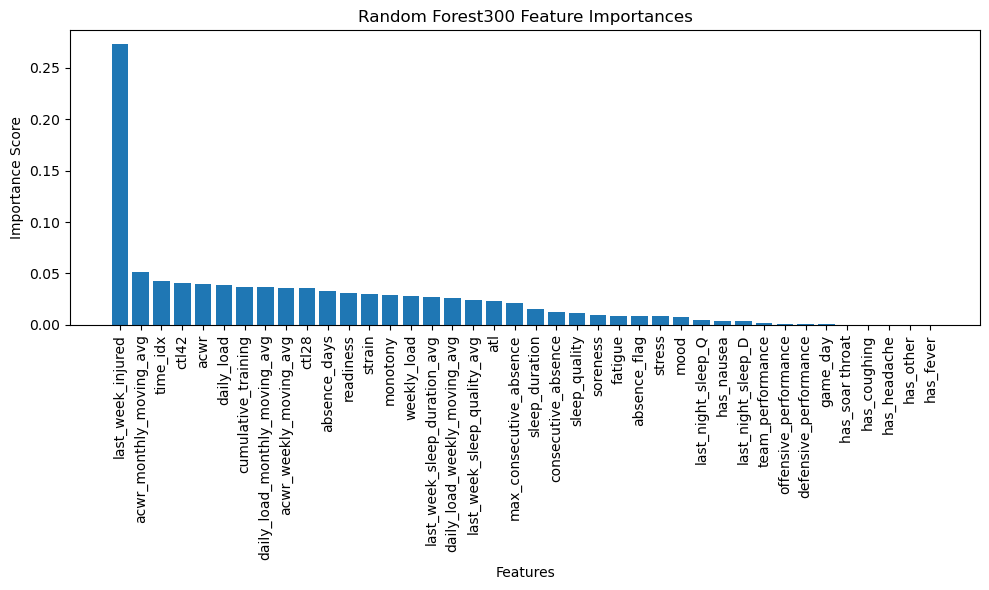

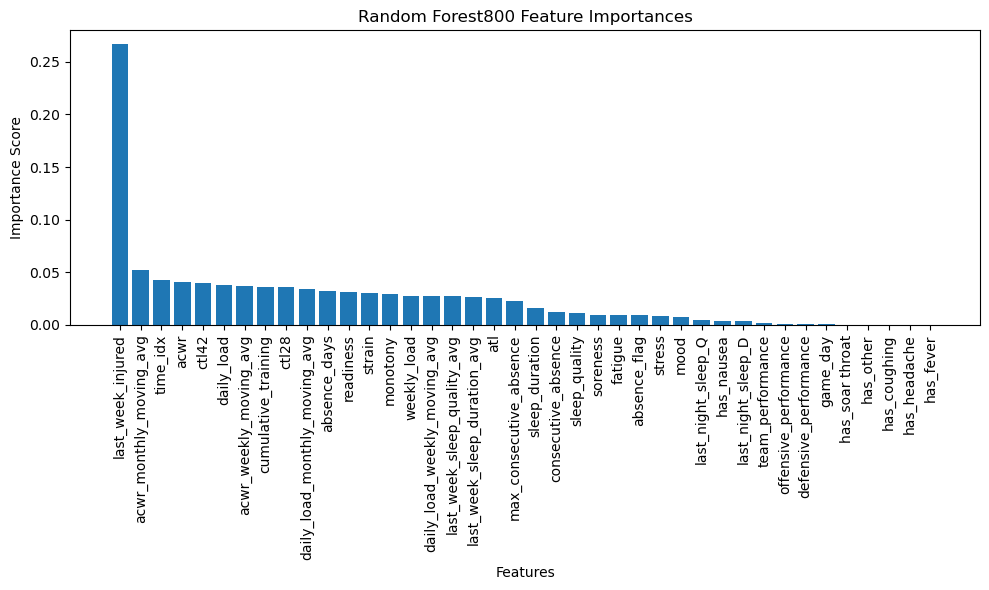

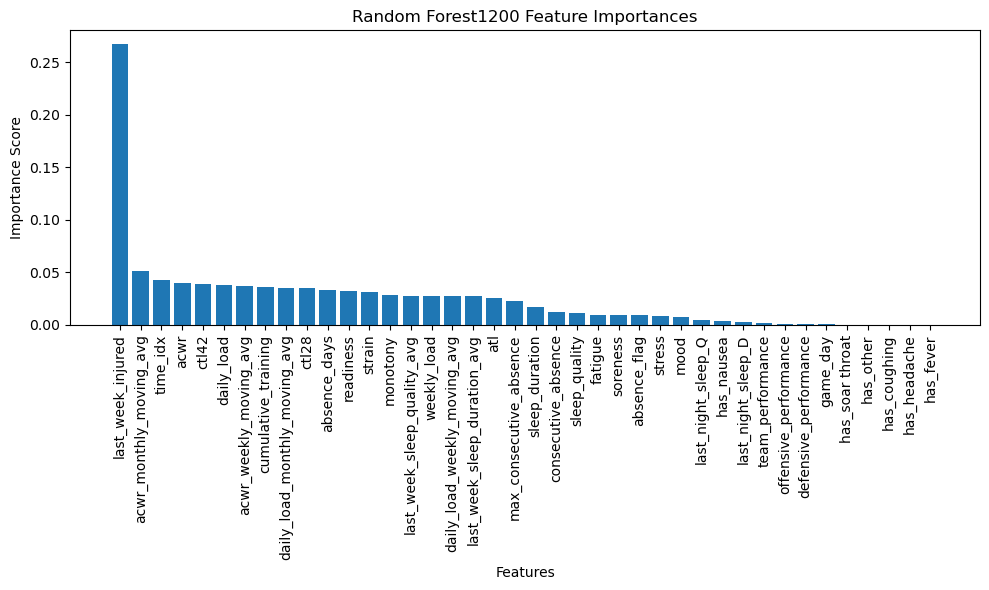

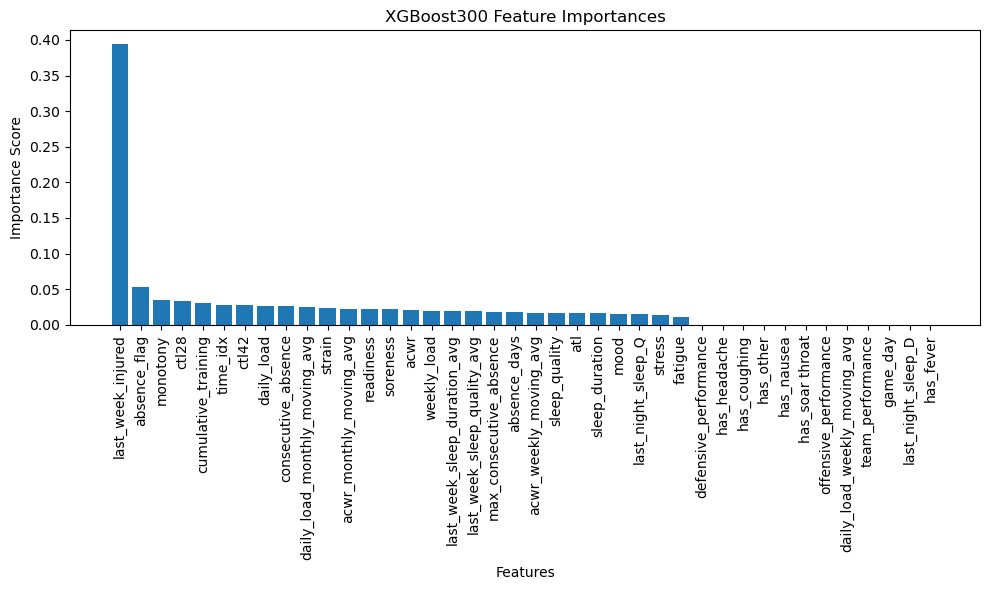

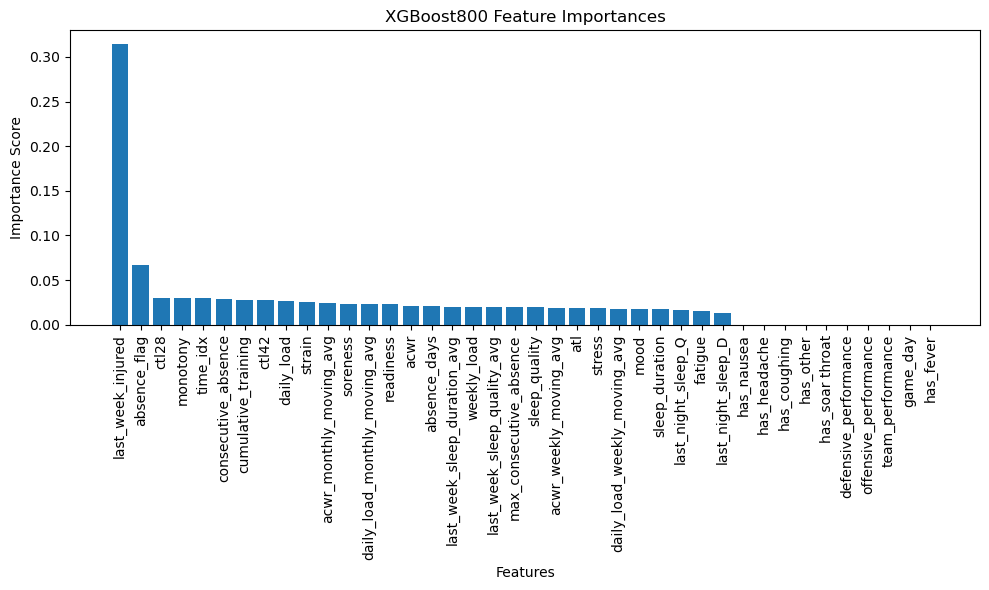

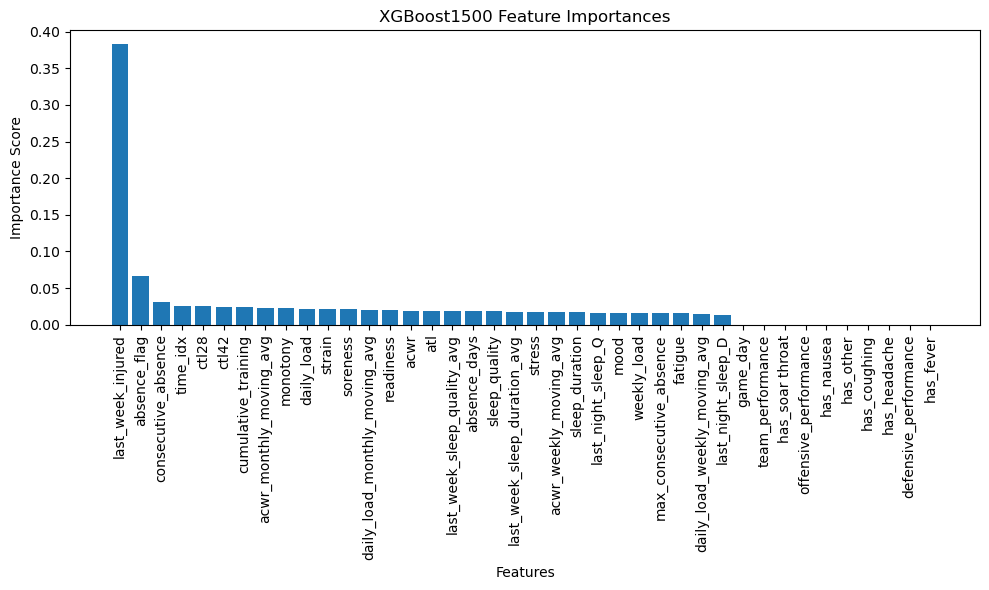

In [57]:
plot_model_information(all_models, X_test,['RuleFit200', 'Random Forest300', 'Random Forest800', 'Random Forest1200', 'XGBoost300', 'XGBoost800', 'XGBoost1500'])


Confusion Matrix (Default Threshold = 0.5):
                 Predicted
                 Class 0  Class 1
Actual Class 0:    4645       3
Actual Class 1:      22       9

Confusion Matrix (Optimal Threshold = 0.240):
                 Predicted
                 Class 0  Class 1
Actual Class 0:    4618      30
Actual Class 1:       5      26


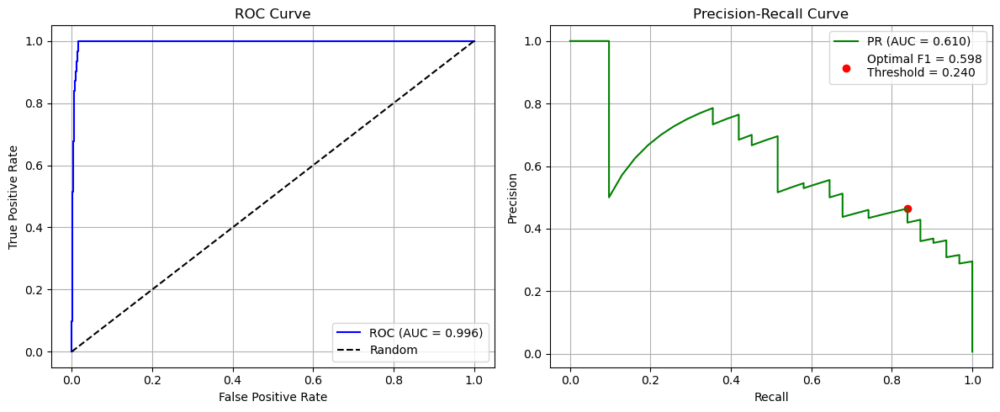


Best F1 Score from PR curve: 0.5977


{'roc_auc': 0.9961690078285491,
 'pr_auc': 0.6102444154662358,
 'optimal_threshold': 0.24033873,
 'best_f1_score': 0.5977011448381557,
 'default_cm': array([[4645,    3],
        [  22,    9]], dtype=int64),
 'optimal_cm': array([[4618,   30],
        [   5,   26]], dtype=int64)}

In [96]:
# Fit best model based on the PR-AUC XGboost 800
instant_model = XGBClassifier(
    colsample_bytree=1.0,
    gamma=0.2,
    learning_rate=0.01,
    max_depth=3,
    min_child_weight=1,
    n_estimators=800,
    scale_pos_weight=1,
    subsample=0.8,
    random_state=RANDOM_STATE
)

instant_model.fit(X_train, y_train)
evaluate_and_visualize_model(instant_model, X_test, y_test)

In [86]:
# evaluate_and_visualize_model(all_models['XGBoost1500'],X_test,y_test)

#### One-Day Model

In [88]:
# Prepare the data
filtered_df_3 = full_df_no_missing.copy()
filtered_df_3 = filtered_df_3[~filtered_df_3['player_id'].isin(players_to_remove)]

# Define columns to shift
columns_to_shift = [col for col in filtered_df_3.columns if col not in ['Date', 'injured', 'time_idx']]

# Shift columns back by one day
shifted_df = filtered_df_3.copy()
shifted_df[columns_to_shift] = shifted_df[columns_to_shift].shift(1)
shifted_df = shifted_df.dropna()


In [89]:
shifted_df.isna().sum()

player_id                        0
Date                             0
acwr                             0
atl                              0
ctl28                            0
ctl42                            0
daily_load                       0
monotony                         0
strain                           0
weekly_load                      0
fatigue                          0
mood                             0
readiness                        0
sleep_duration                   0
sleep_quality                    0
soreness                         0
stress                           0
injured                          0
absence_flag                     0
consecutive_absence              0
max_consecutive_absence          0
absence_days                     0
cumulative_training              0
problems                         0
team_performance                 0
offensive_performance            0
defensive_performance            0
game_day                         0
acwr_weekly_moving_a

In [90]:
filtered_df.last_week_injured.unique()

array([0, 1])

In [91]:
RANDOM_STATE = 0
X_train_3, X_test_3, y_train_3, y_test_3 = split_data(shifted_df,'injured',RANDOM_STATE,['player_id', 'Date','problems','injured'], test_proportion = 0.2)


==== Outcome: injured ====


In [92]:
y_test_3.value_counts()

injured
0    4648
1      31
Name: count, dtype: int64

In [40]:
all_models_3 = train_models(X_train_3, y_train_3, RANDOM_STATE=0)

In [41]:
ML_results_3 = []
for name, model in all_models_3.items():
    try:
        metrics = evaluate_model(model, X_train_3, y_train_3, X_test_3, y_test_3)
        metrics['Model'] = name  # Add model name as column
        ML_results_3.append(metrics)
    except Exception as e:
        print(f"Error evaluating {name}: {str(e)}")
        continue

results_df_3 = pd.DataFrame(ML_results_3).set_index('Model')  # Proper DataFrame structure
print("\nStored columns:", results_df_3.columns.tolist())

C:\Users\tss_0\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\tss_0\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_


Stored columns: ['CV ROC AUC', 'CV PR AUC', 'CV F1 (Optimal)', 'Test ROC AUC', 'Test PR AUC', 'Test F1 (Optimal)', 'Optimal Threshold', 'Probability Scores']


In [46]:
results_df_3

,CV ROC AUC,CV PR AUC,CV F1 (Optimal),Test ROC AUC,Test PR AUC,Test F1 (Optimal),Optimal Threshold,Probability Scores
Model,,,,,,,,
RuleFit200,0.928475,0.277053,0.373773,0.944423,0.252510,0.322581,0.028842,"[7.628636115964548e-07, 5.637550036531059e-07,..."
Random Forest300,0.950347,0.329975,0.433997,0.942424,0.345475,0.333333,0.171436,"[0.0029365079365079364, 0.0, 0.0, 0.0008333333..."
Random Forest800,0.953048,0.322158,0.421998,0.947230,0.342030,0.340909,0.173061,"[0.0024717712842712842, 0.0, 0.0, 0.0049337121..."
Random Forest1200,0.955343,0.320439,0.423525,0.944770,0.348222,0.340909,0.174568,"[0.002258958633958634, 0.0, 0.0, 0.00473679098..."
XGBoost300,0.929426,0.282602,0.422967,0.937701,0.330403,0.382979,0.201513,"[0.007298493, 0.008343236, 0.008888432, 0.0157..."
XGBoost800,0.946075,0.310521,0.417298,0.948278,0.420510,0.434783,0.174562,"[0.001354748, 0.0019103487, 0.0029228022, 0.01..."
XGBoost1500,0.946438,0.312212,0.414502,0.948924,0.420899,0.395062,0.175062,"[0.0014176044, 0.0017374048, 0.002737348, 0.00..."
Logistic Regression,0.929779,0.251925,0.400929,0.944909,0.241418,0.389831,0.122165,"[0.001990738972785712, 0.001251001528455823, 0..."


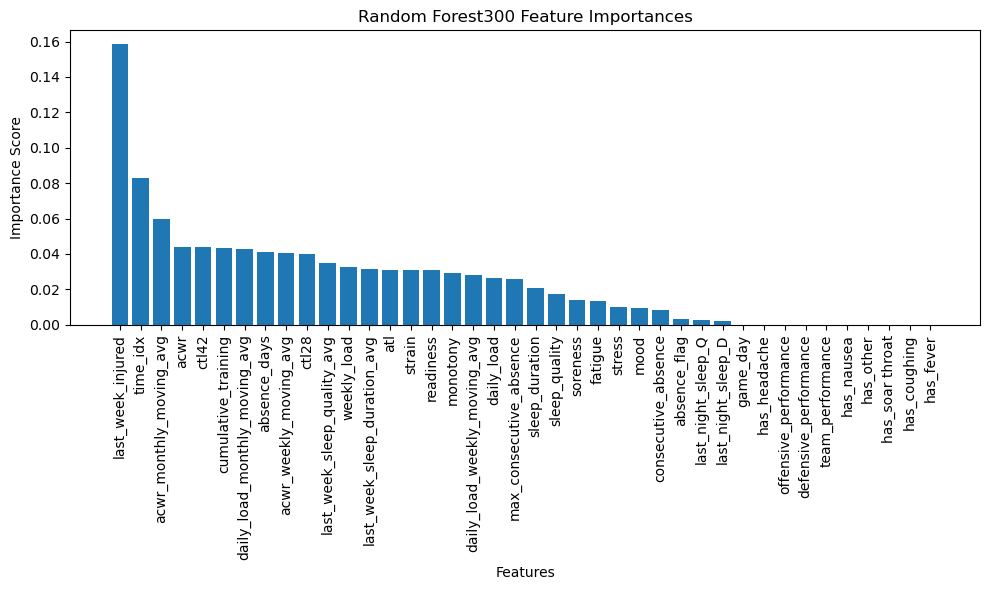

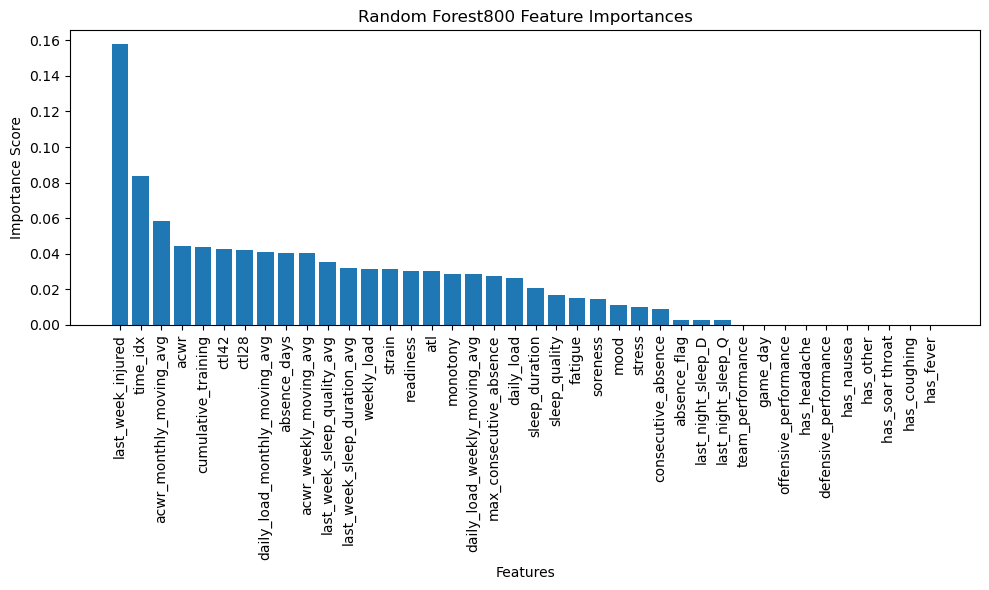

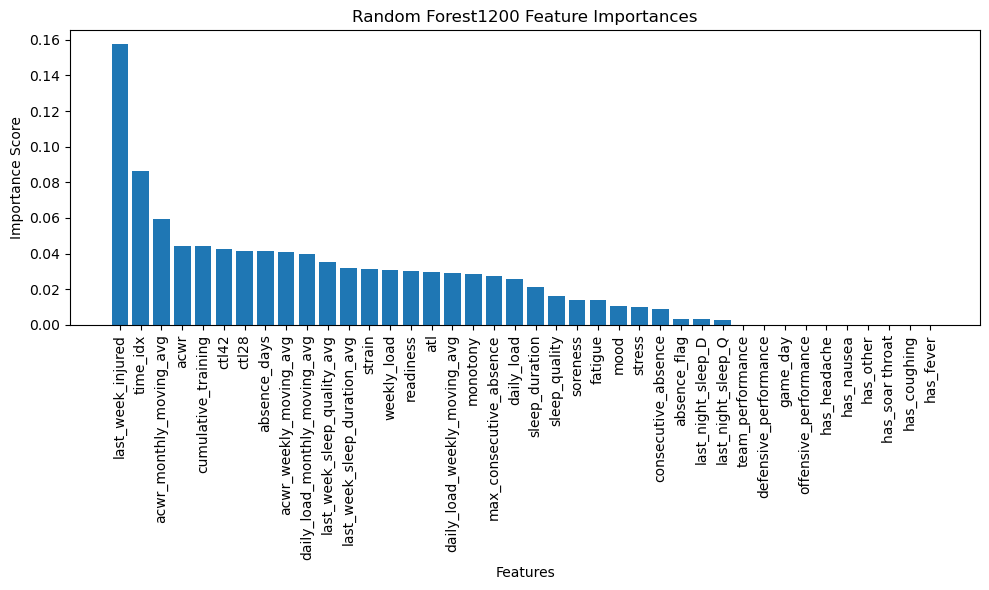

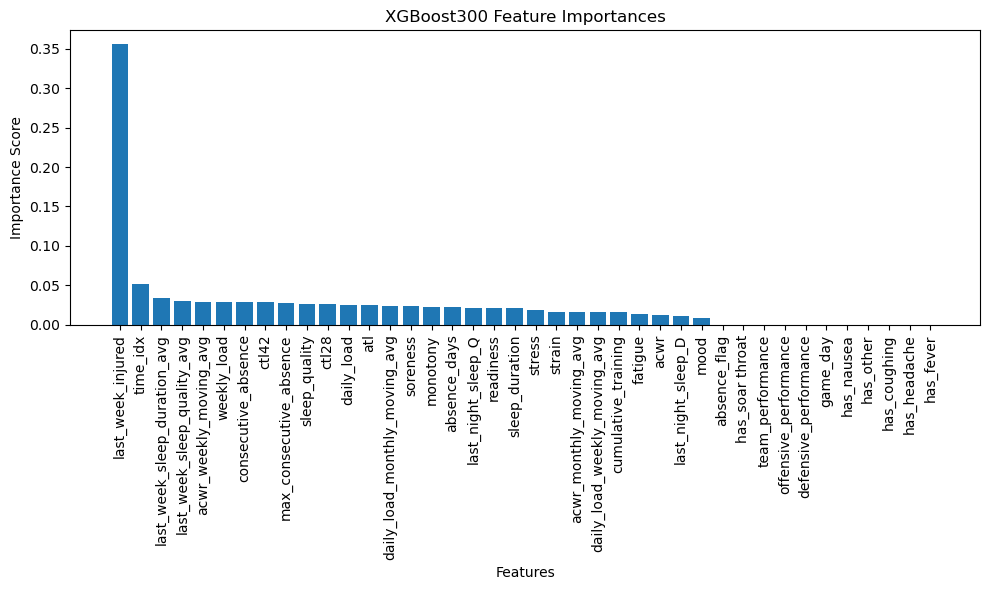

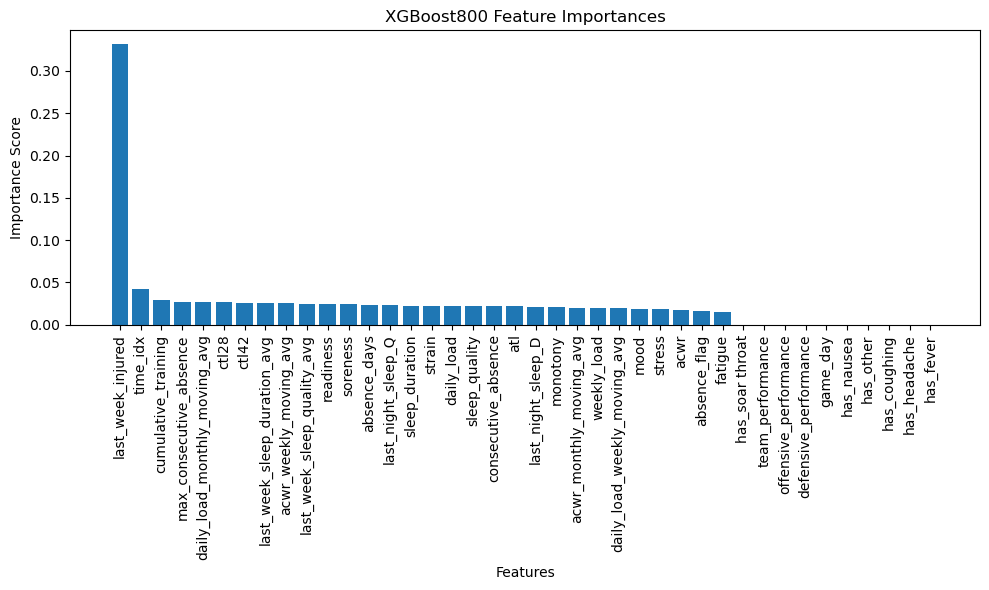

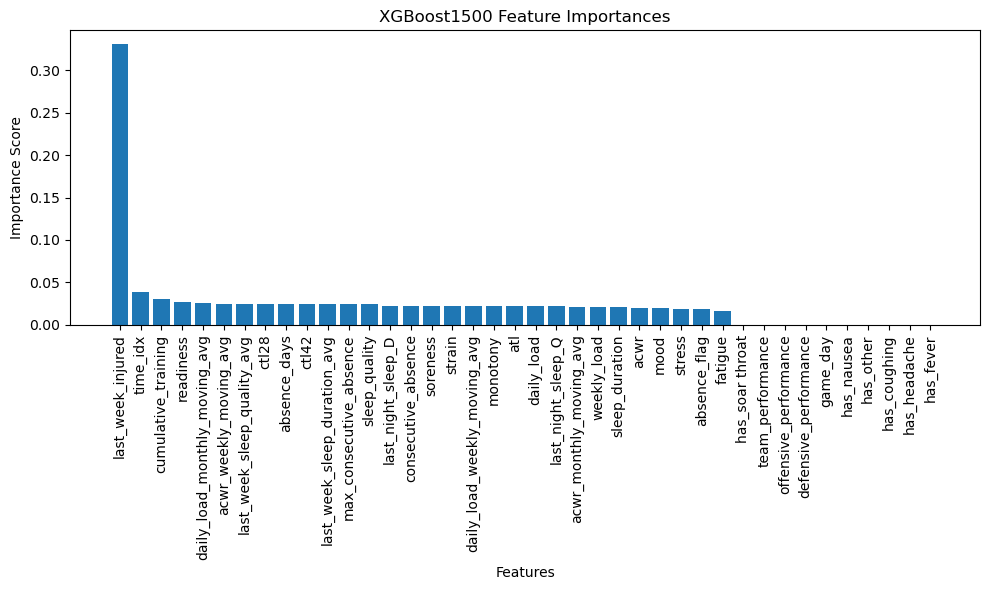

In [47]:
plot_model_information(all_models_3, X_test_3,['RuleFit200', 'Random Forest300', 'Random Forest800', 'Random Forest1200', 'XGBoost300', 'XGBoost800', 'XGBoost1500'])


Confusion Matrix (Default Threshold = 0.5):
                 Predicted
                 Class 0  Class 1
Actual Class 0:    4647       1
Actual Class 1:      27       4

Confusion Matrix (Optimal Threshold = 0.367):
                 Predicted
                 Class 0  Class 1
Actual Class 0:    4643       5
Actual Class 1:      20      11


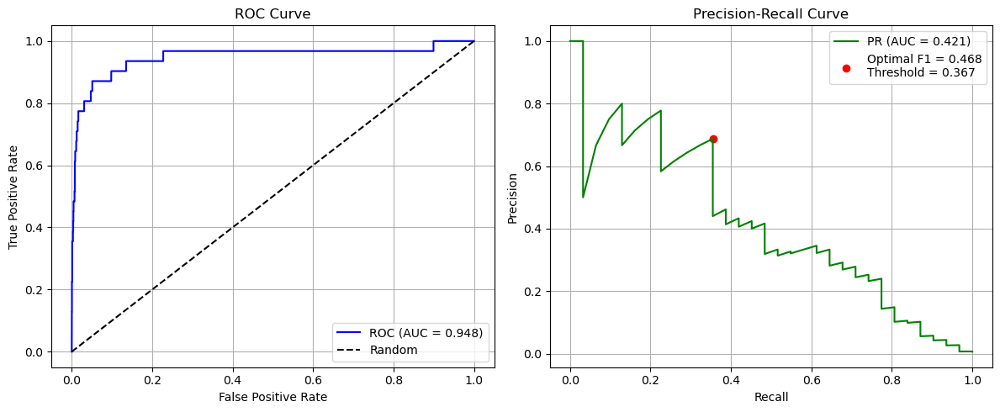


Best F1 Score from PR curve: 0.4681


{'roc_auc': 0.9482781355838099,
 'pr_auc': 0.4205096093200782,
 'optimal_threshold': 0.366666,
 'best_f1_score': 0.46808510189225894,
 'default_cm': array([[4647,    1],
        [  27,    4]], dtype=int64),
 'optimal_cm': array([[4643,    5],
        [  20,   11]], dtype=int64)}

In [93]:
# Fit best model based on the PR-AUC XGboost 800
one_day_model = XGBClassifier(
    colsample_bytree=1.0,
    gamma=0.2,
    learning_rate=0.01,
    max_depth=3,
    min_child_weight=1,
    n_estimators=800,
    scale_pos_weight=1,
    subsample=0.8,
    random_state=RANDOM_STATE
)

one_day_model.fit(X_train_3, y_train_3)
evaluate_and_visualize_model(one_day_model, X_test_3, y_test_3)